In [1]:
%run "C:/Users/ssiva/Documents_Karthik/Machine_Learning/Machine_Learning_Algorithms/Machine_Learning_Algorithms.ipynb"

Available functions:


create_random_df(model,nrows,ncols,nclasses,target_multiplier = 1),

find_cols_to_ignore(df,thresh_cat = 0.02,cols_to_ignore = None),

impute_cols(df,k=None,null_cols = 'auto_select',thresh_null_cat = 0.02,cols_to_ignore = None),

num_unique_values_in_cols(df,cols = None),

remove_outliers(df_in,outlier_cols = None,thresh_cat = 0.02,remove = True),

convert_cat(df, cat_cols=None,output_col=None,reset_index = False),

normalize(df,cols_to_ignore = None,target_col = None),

split_df(df,test_size = 0.3,df_to_return = 'df_train'),

shuffled_split_dfs(df,test_size = 0.3),

check_accuracy(df = None,pred_df = None, test_df = None, algo = 'lin',target_class = None),

stoch_grad_desc(dataset,output_col,cols_to_ignore = None,alpha = 0.1,epoch = 10,algo = 'lin',initial_coeffs = 1, bias_coeff = None),

make_predictions(dataset, coeff_list, output_col,cols_to_ignore = None,algo = 'lin',log_reg_thresh = 0.5),

optimize_log_reg(test_data,coeffs,output_col,num_steps=40,algo = 'l

In [2]:
counties = pd.read_csv(r'C:/Users/ssiva/Documents_Karthik/Machine_Learning/US_States_Data/us_county_sociohealth_data.csv')

In [3]:
counties.head()

,fips,state,county,lat,lon,total_population,area_sqmi,population_density_per_sqmi,num_deaths,years_of_potential_life_lost_rate,percent_fair_or_poor_health,average_number_of_physically_unhealthy_days,average_number_of_mentally_unhealthy_days,percent_low_birthweight,percent_smokers,percent_adults_with_obesity,food_environment_index,percent_physically_inactive,percent_with_access_to_exercise_opportunities,percent_excessive_drinking,num_alcohol_impaired_driving_deaths,num_driving_deaths,percent_driving_deaths_with_alcohol_involvement,num_chlamydia_cases,chlamydia_rate,teen_birth_rate,num_uninsured,percent_uninsured,num_primary_care_physicians,primary_care_physicians_rate,num_dentists,dentist_rate,num_mental_health_providers,mental_health_provider_rate,preventable_hospitalization_rate,percent_with_annual_mammogram,percent_vaccinated,high_school_graduation_rate,num_some_college,population,percent_some_college,num_unemployed_CHR,labor_force,percent_unemployed_CHR,percent_children_in_poverty,eightieth_percentile_income,twentieth_percentile_income,income_ratio,num_single_parent_households_CHR,num_households_CHR,percent_single_parent_households_CHR,num_associations,social_association_rate,annual_average_violent_crimes,violent_crime_rate,num_injury_deaths,injury_death_rate,average_daily_pm2_5,presence_of_water_violation,percent_severe_housing_problems,severe_housing_cost_burden,overcrowding,inadequate_facilities,percent_drive_alone_to_work,num_workers_who_drive_alone,percent_long_commute_drives_alone,life_expectancy,num_deaths_2,age_adjusted_death_rate,num_deaths_3,child_mortality_rate,num_deaths_4,infant_mortality_rate,percent_frequent_physical_distress,percent_frequent_mental_distress,percent_adults_with_diabetes,num_hiv_cases,hiv_prevalence_rate,num_food_insecure,percent_food_insecure,num_limited_access,percent_limited_access_to_healthy_foods,num_drug_overdose_deaths,drug_overdose_mortality_rate,num_motor_vehicle_deaths,motor_vehicle_mortality_rate,percent_insufficient_sleep,num_uninsured_2,percent_uninsured_2,num_uninsured_3,percent_uninsured_3,other_primary_care_provider_rate,percent_disconnected_youth,average_grade_performance,average_grade_performance_2,median_household_income,percent_enrolled_in_free_or_reduced_lunch,segregation_index,segregation_index_2,homicide_rate,num_deaths_5,suicide_rate_age_adjusted,num_firearm_fatalities,firearm_fatalities_rate,juvenile_arrest_rate,average_traffic_volume_per_meter_of_major_roadways,num_homeowners,percent_homeowners,num_households_with_severe_cost_burden,percent_severe_housing_cost_burden,population_2,percent_less_than_18_years_of_age,percent_65_and_over,num_black,percent_black,num_american_indian_alaska_native,percent_american_indian_alaska_native,num_asian,percent_asian,num_native_hawaiian_other_pacific_islander,percent_native_hawaiian_other_pacific_islander,num_hispanic,percent_hispanic,num_non_hispanic_white,percent_non_hispanic_white,num_not_proficient_in_english,percent_not_proficient_in_english,percent_female,num_rural,percent_rural,num_housing_units,num_households_CDC,num_below_poverty,num_unemployed_CDC,per_capita_income,num_no_highschool_diploma,num_age_65_and_older,num_age_17_and_younger,num_disabled,num_single_parent_households_CDC,num_minorities,num_limited_english_abilities,num_multi_unit_housing,num_mobile_homes,num_overcrowding,num_households_with_no_vehicle,num_institutionalized_in_group_quarters,percent_below_poverty,percent_unemployed_CDC,percent_no_highschool_diploma,percent_age_65_and_older,percent_age_17_and_younger,percent_disabled,percent_single_parent_households_CDC,percent_minorities,percent_limited_english_abilities,percent_multi_unit_housing,percent_mobile_homes,percent_overcrowding,percent_no_vehicle,percent_institutionalized_in_group_quarters,percentile_rank_below_poverty,percentile_rank_unemployed,percentile_rank_per_capita_income,percentile_rank_no_highschool_diploma,percentile_rank_socioeconomic_theme,percentile_rank_age_65_and_older,percentile_rank_age_17_

In [4]:
counties.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3144 entries, 0 to 3143
Columns: 181 entries, fips to percentile_rank_social_vulnerability
dtypes: float64(147), int64(30), object(4)
memory usage: 4.3+ MB


In [5]:
percent_cols = [col for col in counties.columns if col[:8] == 'percent_']

In [6]:
percent_cols

['percent_fair_or_poor_health',
 'percent_low_birthweight',
 'percent_smokers',
 'percent_adults_with_obesity',
 'percent_physically_inactive',
 'percent_with_access_to_exercise_opportunities',
 'percent_excessive_drinking',
 'percent_driving_deaths_with_alcohol_involvement',
 'percent_uninsured',
 'percent_with_annual_mammogram',
 'percent_vaccinated',
 'percent_some_college',
 'percent_unemployed_CHR',
 'percent_children_in_poverty',
 'percent_single_parent_households_CHR',
 'percent_severe_housing_problems',
 'percent_drive_alone_to_work',
 'percent_long_commute_drives_alone',
 'percent_frequent_physical_distress',
 'percent_frequent_mental_distress',
 'percent_adults_with_diabetes',
 'percent_food_insecure',
 'percent_limited_access_to_healthy_foods',
 'percent_insufficient_sleep',
 'percent_uninsured_2',
 'percent_uninsured_3',
 'percent_disconnected_youth',
 'percent_enrolled_in_free_or_reduced_lunch',
 'percent_homeowners',
 'percent_severe_housing_cost_burden',
 'percent_less_t

In [7]:
len(percent_cols)

55

In [8]:
[col for col in [col for col in counties.columns if 'percent' in col] if col not in percent_cols]

['eightieth_percentile_income',
 'twentieth_percentile_income',
 'percentile_rank_below_poverty',
 'percentile_rank_unemployed',
 'percentile_rank_per_capita_income',
 'percentile_rank_no_highschool_diploma',
 'percentile_rank_socioeconomic_theme',
 'percentile_rank_age_65_and_older',
 'percentile_rank_age_17_and_younger',
 'percentile_rank_disabled',
 'percentile_rank_single_parent_households',
 'percentile_rank_household_comp_disability_theme',
 'percentile_rank_minorities',
 'percentile_rank_limited_english_abilities',
 'percentile_rank_minority_status_and_language_theme',
 'percentile_rank_multi_unit_housing',
 'percentile_rank_mobile_homes',
 'percentile_rank_overcrowding',
 'percentile_rank_no_vehicle',
 'percentile_rank_institutionalized_in_group_quarters',
 'percentile_rank_housing_and_transportation',
 'percentile_rank_social_vulnerability']

In [9]:
num_cols = [col for col in counties.columns if 'num' in col]

In [10]:
num_cols = ['total_population','area_sqmi','population_density_per_sqmi','years_of_potential_life_lost_rate'] + num_cols

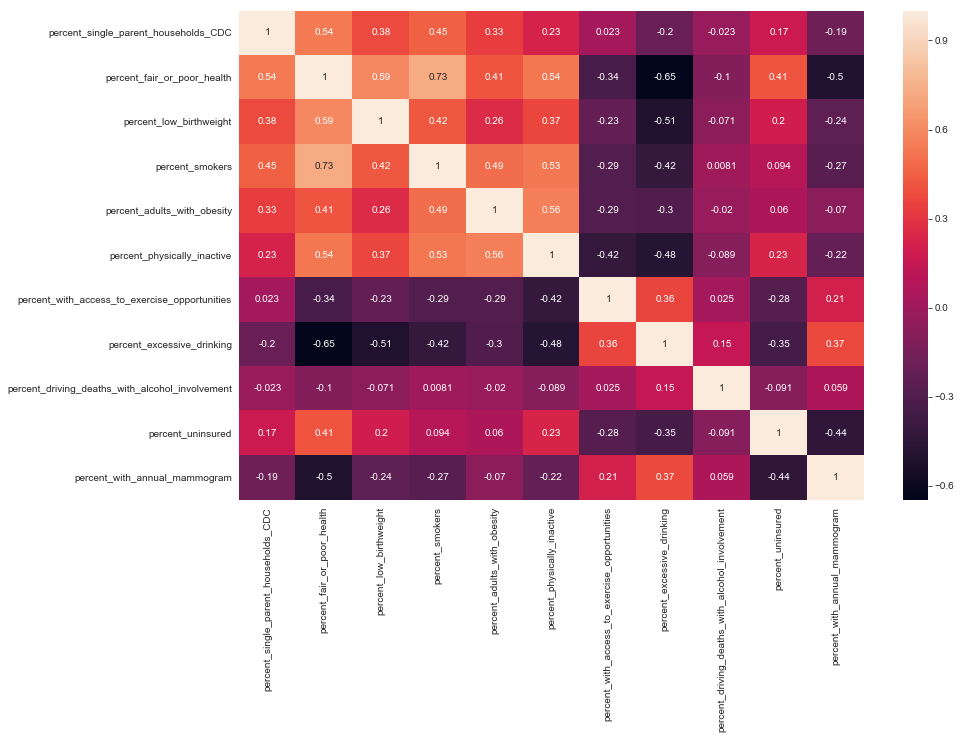

In [11]:
sns.heatmap(counties[['percent_single_parent_households_CDC'] + percent_cols[:10]].corr(),annot = True)

In [12]:
counties[percent_cols].corr()['percent_single_parent_households_CDC'].sort_values(ascending = False)

percent_single_parent_households_CDC               1.000000
percent_single_parent_households_CHR               0.694132
percent_minorities                                 0.591142
percent_fair_or_poor_health                        0.537091
percent_below_poverty                              0.530441
percent_unemployed_CDC                             0.493282
percent_enrolled_in_free_or_reduced_lunch          0.488902
percent_black                                      0.482981
percent_food_insecure                              0.481847
percent_insufficient_sleep                         0.478092
percent_frequent_physical_distress                 0.475725
percent_smokers                                    0.452163
percent_children_in_poverty                        0.446864
percent_severe_housing_problems                    0.434374
percent_overcrowding                               0.425079
percent_age_17_and_younger                         0.423710
percent_frequent_mental_distress        

In [13]:
print('      ___       ___')
print('  ____      ___      _____')
print('____                    ____')
print(' ____      Karthik    ____')
print('   ____    Aarthi    ____')
print('     ____          ____')
print('       ____      ____')
print('           _____')

      ___       ___
  ____      ___      _____
____                    ____
 ____      Karthik    ____
   ____    Aarthi    ____
     ____          ____
       ____      ____
           _____


In [14]:
state_abs_df = counties.groupby('state').sum()[num_cols]

In [15]:
counties['total_population'].shape,counties[percent_cols].shape

((3144,), (3144, 55))

In [16]:
state_perc_df = state_abs_df[['total_population']].merge((counties[['state','county','total_population']].merge(counties[percent_cols].multiply(counties['total_population']/100, axis="index"),\
how = 'inner',left_index = True,right_index = True).groupby('state').sum()[percent_cols].div((counties.groupby('state').sum()['total_population']),axis = 0)*100),how = 'inner',left_index = True,right_index = True)

In [17]:
state_perc_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 51 entries, Alabama to Wyoming
Data columns (total 56 columns):
total_population                                   51 non-null int64
percent_fair_or_poor_health                        51 non-null float64
percent_low_birthweight                            51 non-null float64
percent_smokers                                    51 non-null float64
percent_adults_with_obesity                        51 non-null float64
percent_physically_inactive                        51 non-null float64
percent_with_access_to_exercise_opportunities      51 non-null float64
percent_excessive_drinking                         51 non-null float64
percent_driving_deaths_with_alcohol_involvement    51 non-null float64
percent_uninsured                                  51 non-null float64
percent_with_annual_mammogram                      51 non-null float64
percent_vaccinated                                 51 non-null float64
percent_some_college                     

In [18]:
state_perc_df.head()

,total_population,percent_fair_or_poor_health,percent_low_birthweight,percent_smokers,percent_adults_with_obesity,percent_physically_inactive,percent_with_access_to_exercise_opportunities,percent_excessive_drinking,percent_driving_deaths_with_alcohol_involvement,percent_uninsured,percent_with_annual_mammogram,percent_vaccinated,percent_some_college,percent_unemployed_CHR,percent_children_in_poverty,percent_single_parent_households_CHR,percent_severe_housing_problems,percent_drive_alone_to_work,percent_long_commute_drives_alone,percent_frequent_physical_distress,percent_frequent_mental_distress,percent_adults_with_diabetes,percent_food_insecure,percent_limited_access_to_healthy_foods,percent_insufficient_sleep,percent_uninsured_2,percent_uninsured_3,percent_disconnected_youth,percent_enrolled_in_free_or_reduced_lunch,percent_homeowners,percent_severe_housing_cost_burden,percent_less_than_18_years_of_age,percent_65_and_over,percent_black,percent_american_indian_alaska_native,percent_asian,percent_native_hawaiian_other_pacific_islander,percent_hispanic,percent_non_hispanic_white,percent_not_proficient_in_english,percent_female,percent_rural,percent_below_poverty,percent_unemployed_CDC,percent_no_highschool_diploma,percent_age_65_and_older,percent_age_17_and_younger,percent_disabled,percent_single_parent_households_CDC,percent_minorities,percent_limited_english_abilities,percent_multi_unit_housing,percent_mobile_homes,percent_overcrowding,percent_no_vehicle,percent_institutionalized_in_group_quarters
state,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Alabama,4841164,21.515834,10.208255,18.845175,35.495411,29.795249,61.370660,14.620799,26.922322,11.074776,39.959841,41.356968,59.979603,3.991146,24.079801,37.425174,14.326675,85.804353,34.461462,14.257761,14.881675,14.251731,15.803973,7.885479,37.414553,14.143951,3.028307,7.130858,56.258690,68.600810,12.646609,22.297471,16.942693,26.736254,0.705256,1.483484,0.106538,4.423958,65.209683,1.061134,51.641135,40.677434,18.422597,8.399860,15.158446,15.332481,22.822845,16.341430,9.621446,33.801184,1.141597,7.023993,13.229587,1.698812,6.432407,2.439064
Alaska,736855,14.882639,5.703258,17.333584,32.448273,20.020919,96.867091,21.613994,34.616599,14.731792,29.867827,29.542308,64.538748,6.733028,13.610706,29.346802,21.330076,67.802799,15.388692,10.805897,10.733973,7.886740,13.164005,9.162846,31.150078,17.142339,9.143623,8.242891,42.953767,63.969603,12.239672,24.890245,11.789210,3.422641,15.348769,6.750079,1.411977,7.282949,60.062026,1.718778,47.863815,31.033899,10.127047,8.133442,7.771210,9.392871,25.453835,11.279424,10.196896,38.055403,1.673899,7.687689,4.518644,7.216046,10.516290,3.791470
Arizona,6728577,16.865978,7.201044,14.625972,27.542144,21.766439,85.333020,17.492863,25.999564,12.114011,41.157599,45.075475,63.217599,4.933570,20.403439,35.678506,18.504925,76.747543,35.197411,11.679549,12.205053,9.674412,14.189949,7.439377,33.347587,14.026107,7.677802,8.560153,55.183504,63.656369,14.178479,22.888645,17.585856,4.346253,5.399810,3.659660,0.274827,31.616946,54.358979,4.869210,50.290095,9.948573,17.742407,8.153878,13.833335,15.882591,24.049708,12.614611,9.757000,43.858040,5.095104,11.853311,10.068892,4.527625,6.724287,2.300098
Arkansas,2968472,21.273745,8.946592,19.568669,34.224394,31.578165,63.907297,14.929398,26.776050,9.271928,37.050013,45.933306,57.818952,3.802985,24.374035,36.376423,14.301301,82.728730,26.723336,13.271645,14.207503,13.384952,16.819348,8.646220,34.176812,11.329116,4.307497,6.345369,35.401977,65.676048,11.685997,23.291557,17.065687,15.885834,0.989539,1.635263,0.344343,7.583530,71.975849,1.582001,50.893596,43.306265,18.878768,6.955107,14.782557,15.664350,23.829661,16.941787,9.537742,26.634196,1.589760,6.477839,12.256901,2.630970,6.363001,2.798870
California,38654206,15.981684,6.798515,11.067835,23.782357,17.727755,93.120048,19.517813,28.593378,8.213378,35.511710,40.833252,64.631815,4.291814,16.914170,30.850862,26.984334,74.155999,41.190003,10.732070,11.243582,8.58978

In [19]:
state_abs_df.head()

,total_population,area_sqmi,population_density_per_sqmi,years_of_potential_life_lost_rate,num_deaths,average_number_of_physically_unhealthy_days,average_number_of_mentally_unhealthy_days,num_alcohol_impaired_driving_deaths,num_driving_deaths,num_chlamydia_cases,num_uninsured,num_primary_care_physicians,num_dentists,num_mental_health_providers,num_some_college,num_unemployed_CHR,num_single_parent_households_CHR,num_households_CHR,num_associations,num_injury_deaths,num_workers_who_drive_alone,num_deaths_2,num_deaths_3,num_deaths_4,num_hiv_cases,num_food_insecure,num_limited_access,num_drug_overdose_deaths,num_motor_vehicle_deaths,num_uninsured_2,num_uninsured_3,num_deaths_5,num_firearm_fatalities,num_homeowners,num_households_with_severe_cost_burden,num_black,num_american_indian_alaska_native,num_asian,num_native_hawaiian_other_pacific_islander,num_hispanic,num_non_hispanic_white,num_not_proficient_in_english,num_rural,num_housing_units,num_households_CDC,num_below_poverty,num_unemployed_CDC,num_no_highschool_diploma,num_age_65_and_older,num_age_17_and_younger,num_disabled,num_single_parent_households_CDC,num_minorities,num_limited_english_abilities,num_multi_unit_housing,num_mobile_homes,num_overcrowding,num_households_with_no_vehicle,num_institutionalized_in_group_quarters
state,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Alabama,4841164,50646.423651,6117.831783,732381.777960,81791.0,332.333362,332.729614,1284.0,4654.0,29935.0,438049.0,3160.0,2355.0,4945.0,744300,86493.0,406913.0,1089671.0,5827,20015.0,2051445.0,81791.0,2986.0,3087.0,12496.0,765910,3.786232e+05,2246.0,6679.0,407278.0,34350.0,3825.0,4989.0,1275223,223063.0,1295175,34375,73167,5207,217181,3197324,48517,1957932.0,2209335,1851061,868666,184479,496036,742394,1105189,777592,178209,1636829,51759,155936,295722,31333,119374,118341
Alaska,736855,570638.009498,230.106371,190312.983968,8087.0,114.520516,104.702493,139.0,374.0,5627.0,94727.0,673.0,737.0,3189.0,137348,23510.0,54574.0,184114.0,759,3412.0,358627.0,8287.0,466.0,353.0,0.0,97240,6.499454e+04,334.0,409.0,78655.0,17351.0,895.0,788.0,162172,30113.0,24861,113516,49025,10221,53288,444411,11721,219018.0,309171,250235,72826,30139,36032,69305,187616,80492,25064,280280,11474,22785,14417,16310,23715,27761
Arizona,6728577,113590.652461,818.820548,141146.116123,80394.0,64.953154,65.368780,1177.0,4626.0,39598.0,685974.0,4663.0,4411.0,9552.0,1143921,166205.0,574655.0,1617093.0,3930,28744.0,3008707.0,80394.0,3197.0,3314.0,15524.0,968060,4.821987e+05,4583.0,6200.0,568501.0,130048.0,6539.0,5270.0,1606065,346682.0,313875,380160,263696,19789,2266343,3902867,316488,651358.0,2913541,2448919,1165636,249972,611243,1070151,1619618,833586,237676,2950701,320154,336369,309197,109307,164945,152762
Arkansas,2968472,52035.552487,4140.571530,796145.109158,48017.0,357.188854,357.251394,690.0,2622.0,17320.0,226179.0,2000.0,1398.0,6820.0,442445,50038.0,251428.0,696561.0,3370,12245.0,1274750.0,48017.0,1782.0,1551.0,5412.0,500160,2.549699e+05,1096.0,3855.0,197738.0,31478.0,2721.0,2619.0,756431,128471.0,464640,30225,50301,10881,233187,2176611,44593,1278329.0,1341391,1141480,542431,93190,292228,464987,707234,492769,108751,790572,44028,84757,167777,29803,72981,83163
California,38654206,155792.582241,40277.001997,365973.165361,347837.0,217.162776,229.135059,5266.0,17773.0,218785.0,2740078.0,31343.0,33456.0,139697.0,7207217,815409.0,2801098.0,8999228.0,23099,98492.0,17904213.0,347916.0,13296.0,14745.0,123826.0,4317940,1.225949e+06,14824.0,25225.0,2477892.0,295192.0,21416.0,15413.0,7085435,2543373.0,2223274,651076,6063600,199872,15540142,14568608,3597443,1880350.0,13911737,12807387,6004257,1683726,4572963,4976982,9140283,4028190,1210307,23816964,3718345,2358306,517173,1050303,974500,815985


In [20]:
def barplot_states_absolute(plt_df,dep_col,ind_col):
    # Defining the plot size
    plt.figure(figsize=(24, 12))
    plt_df = ((plt_df[dep_col])/1000).round(decimals = 2).reset_index()

    # Defining the values for x-axis, y-axis
    # and from which dataframe the values are to be picked
    plots = sns.barplot(palette = 'mako',x=ind_col, y=dep_col, data = plt_df)

    # Iterrating over the bars one-by-one
    for bar in plots.patches:

      # Using Matplotlib's annotate function and
      # passing the coordinates where the annotation shall be done
      # x-coordinate: bar.get_x() + bar.get_width() / 2
      # y-coordinate: bar.get_height()
      # free space to be left to make graph pleasing: (0, 8)
      # ha and va stand for the horizontal and vertical alignment
        plots.annotate(format(bar.get_height(), '.2f'),
                       (bar.get_x() + bar.get_width() / 2,
                        bar.get_height()), ha='center', va='center',
                       size=12, xytext=(0, 8),
                       textcoords='offset points')

    # Setting the label for x-axis
    plt.xlabel("%s" % (ind_col[0].upper()+ind_col[1:]), size=22)
    plt.xticks(rotation = 65,size = 15)

    # Setting the label for y-axis
    plt.ylabel("%s in Thousands" % (' '.join([word[0].upper() + word[1:] for word in dep_col.split('_')])), size=22)
    plt.yticks(size = 18)
    plt.ylim(0,plt_df[dep_col].max()*1.2)

    plt.axhline(y = plt_df[dep_col].mean(),color = 'black',label = "%s Average (%s)" % (ind_col[0].upper()+ind_col[1:],format((plt_df[dep_col].mean()), '.2f')))
    plt.legend(loc = 'upper left',fontsize = 22)
    # Setting the title for the graph
    plt.title("%s by %s" % (' '.join([word[0].upper() + word[1:] for word in dep_col.split('_')]), (ind_col[0].upper()+ind_col[1:])) ,size = 30)
    plt.tight_layout()
    # Finally showing the plot
    plt.show()

In [21]:
def barplot_states_percent(plt_df,dep_col,ind_col,total_col):
    # Defining the plot size
    plt.figure(figsize=(24, 12))
    plt_df = plt_df.reset_index()

    # Defining the values for x-axis, y-axis
    # and from which dataframe the values are to be picked
    plots = sns.barplot(palette = 'mako',x=ind_col, y=dep_col, data = plt_df)

    # Iterrating over the bars one-by-one
    for bar in plots.patches:
        plots.annotate(format(bar.get_height(), '.2f'),
                       (bar.get_x() + bar.get_width() / 2,
                        bar.get_height()), ha='center', va='center',
                       size=12, xytext=(0, 8),
                       textcoords='offset points')

    # Setting the label for x-axis
    plt.xlabel("%s" % (ind_col[0].upper() + ind_col[1:]), size=24)
    plt.xticks(rotation = 65,size = 12)

    # Setting the label for y-axis
    plt.ylabel(' '.join([word[0].upper() + word[1:] for word in dep_col.split('_')]), size=24)
    plt.yticks(size = 18)
    plt.ylim(0,plt_df[dep_col].max()*1.2)

    plt.axhline(y = plt_df[dep_col].mean(),color = 'black',label = "%s Average\n(%s percent)" % (ind_col[0].upper() + ind_col[1:],format((plt_df[dep_col].mean()), '.2f')))
    plt.axhline(y = plt_df[[total_col,dep_col]].apply(lambda cols: (cols[0]*cols[1])/plt_df[total_col].sum(),axis = 1)\
                .sum(),color = 'blue',label = "Overall Average\n(%s percent)" % format(plt_df[[total_col,dep_col]].apply(lambda cols: (cols[0]*cols[1])/plt_df[total_col].sum(),axis = 1).sum(), '.2f'))
    plt.legend(loc = 'upper left',fontsize = 18)


    # Setting the title for the graph
    plt.title("%s by %s" % ((' '.join([word[0].upper() + word[1:] for word in dep_col.split('_')])),ind_col[0].upper() + ind_col[1:]),size = 30)
    plt.tight_layout()
    # Finally showing the plot
    plt.show()

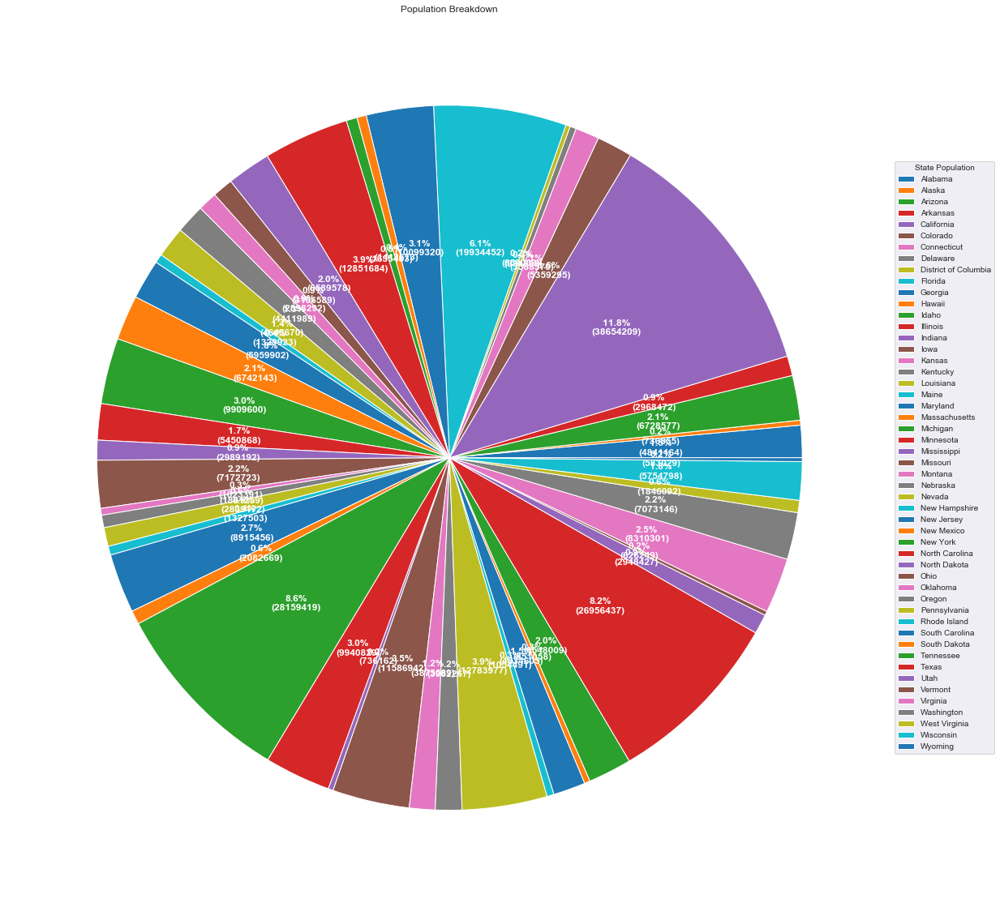

In [22]:
fig, ax = plt.subplots(figsize=(20, 20), subplot_kw=dict(aspect="equal"))

data = state_abs_df['total_population']

def func(pct, allvals):
    absolute = int(np.round(pct/100.*np.sum(allvals)))
    return "{:.1f}%\n({:d})".format(pct, absolute)


wedges, texts, autotexts = ax.pie(data, autopct=lambda pct: func(pct, data),
                                  textprops=dict(color="w"))

ax.legend(wedges, state_abs_df.index,
          title="State Population",
          loc="center left",
          bbox_to_anchor=(1, 0, 0.5, 1))

plt.setp(autotexts, size=12, weight="bold")

ax.set_title("Population Breakdown")

plt.show()

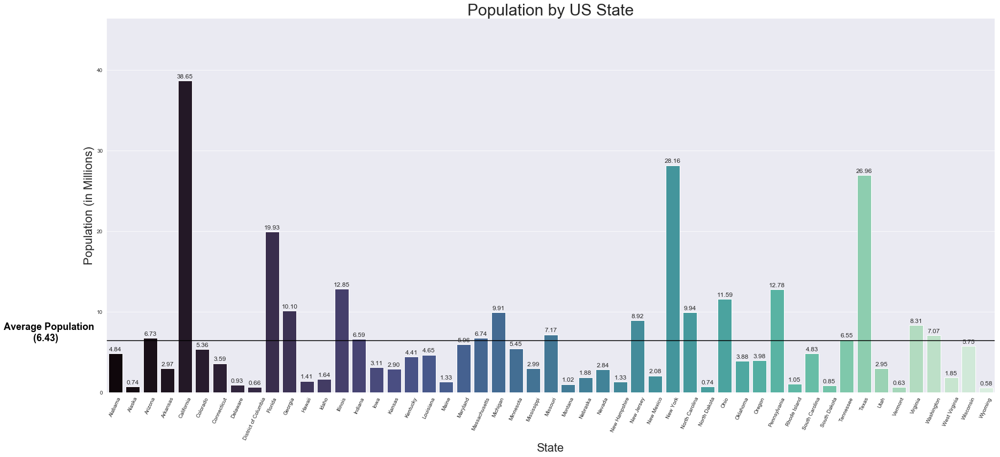

In [23]:
# Defining the plot size
plt.figure(figsize=(24, 12))
plt_df = (state_abs_df['total_population']/1000000).round(decimals = 2).reset_index()
# Defining the values for x-axis, y-axis
# and from which dataframe the values are to be picked
plots = sns.barplot(palette = 'mako',x="state", y="total_population", data = plt_df)

# Iterrating over the bars one-by-one
for bar in plots.patches:
   
  # Using Matplotlib's annotate function and
  # passing the coordinates where the annotation shall be done
  # x-coordinate: bar.get_x() + bar.get_width() / 2
  # y-coordinate: bar.get_height()
  # free space to be left to make graph pleasing: (0, 8)
  # ha and va stand for the horizontal and vertical alignment
    plots.annotate(format(bar.get_height(), '.2f'),
                   (bar.get_x() + bar.get_width() / 2,
                    bar.get_height()), ha='center', va='center',
                   size=12, xytext=(0, 8),
                   textcoords='offset points')
 
# Setting the label for x-axis
plt.xlabel("State", size=22)
plt.xticks(rotation = 65)

# Setting the label for y-axis
plt.ylabel("Population (in Millions)", size=22)
plt.ylim(0,plt_df['total_population'].max()*1.2)

plt.axhline(y = plt_df['total_population'].mean(),color = 'black')
plt.annotate('Average Population\n           (%s)' % np.round(plt_df['total_population'].mean(),2),
              xy = (0.4,1.48), 
              xytext =(-6.4,plt_df['total_population'].mean()), 
              color='black',
              fontweight='bold',
              fontsize = 18)
# Setting the title for the graph
plt.title("Population by US State",size = 30)
plt.tight_layout()
# Finally showing the plot
plt.show()

In [24]:
# barplot_states_absolute(state_abs_df,"population_density_per_sqmi",'state')

In [25]:
# # Defining the plot size
# plt.figure(figsize=(24, 12))
# dep_col = "population_density_per_sqmi"
# ind_col = "state"
# plt_df = ((state_abs_df[dep_col])/1000).round(decimals = 2).reset_index()

# # Defining the values for x-axis, y-axis
# # and from which dataframe the values are to be picked
# plots = sns.barplot(palette = 'mako',x=ind_col, y=dep_col, data = plt_df)

# # Iterrating over the bars one-by-one
# for bar in plots.patches:
   
#   # Using Matplotlib's annotate function and
#   # passing the coordinates where the annotation shall be done
#   # x-coordinate: bar.get_x() + bar.get_width() / 2
#   # y-coordinate: bar.get_height()
#   # free space to be left to make graph pleasing: (0, 8)
#   # ha and va stand for the horizontal and vertical alignment
#     plots.annotate(format(bar.get_height(), '.2f'),
#                    (bar.get_x() + bar.get_width() / 2,
#                     bar.get_height()), ha='center', va='center',
#                    size=12, xytext=(0, 8),
#                    textcoords='offset points')
 
# # Setting the label for x-axis
# plt.xlabel("State", size=22)
# plt.xticks(rotation = 65)

# # Setting the label for y-axis
# plt.ylabel("Population Density\n(Thousands per Square Mile)", size=22)
# plt.yticks(size = 18)
# plt.ylim(0,plt_df[dep_col].max()*1.2)

# plt.axhline(y = plt_df[dep_col].mean(),color = 'black')
# plt.annotate('Average\nPopulation\nDensity\n(%s)' % format((plt_df[dep_col].mean()), '.2f'),
#               xy = (0.4,1.48), 
#               xytext =(-3.6,0.5*plt_df[dep_col].mean()), 
#               color='black',
#               fontweight='bold',
#               fontsize = 18)
# # Setting the title for the graph
# plt.title("Population Density by US State",size = 30)
# plt.tight_layout()
# # Finally showing the plot
# plt.show()

In [26]:
# # Defining the plot size
# plt.figure(figsize=(24, 12))
# dep_col = "percent_fair_or_poor_health"
# ind_col = "state"
# plt_df = state_perc_df.reset_index()

# # Defining the values for x-axis, y-axis
# # and from which dataframe the values are to be picked
# plots = sns.barplot(palette = 'mako',x=ind_col, y=dep_col, data = plt_df)

# # Iterrating over the bars one-by-one
# for bar in plots.patches:
#     plots.annotate(format(bar.get_height(), '.2f'),
#                    (bar.get_x() + bar.get_width() / 2,
#                     bar.get_height()), ha='center', va='center',
#                    size=12, xytext=(0, 8),
#                    textcoords='offset points')
 
# # Setting the label for x-axis
# plt.xlabel("State", size=22)
# plt.xticks(rotation = 65)

# # Setting the label for y-axis
# plt.ylabel("Percent of Population\nwith Fair or Poor Health", size=22)
# plt.yticks(size = 18)
# plt.ylim(0,plt_df[dep_col].max()*1.2)

# plt.axhline(y = plt_df[dep_col].mean(),color = 'black')
# plt.annotate("Average State's Percent\n(%s percent)" % format((plt_df[dep_col].mean()), '.2f'),
#               xy = (0.4,1.48), 
#               xytext =(44,0.896*plt_df[dep_col].mean()), 
#               color='black',
#               fontweight='bold',
#               fontsize = 18)
 

# plt.axhline(y = plt_df[['total_population',dep_col]].apply(lambda cols: (cols[0]*cols[1])/plt_df['total_population'].sum(),axis = 1).sum(),color = 'black')
# plt.annotate("National Average\n(%s percent)" % format(plt_df[['total_population',dep_col]].apply(lambda cols: (cols[0]*cols[1])/plt_df['total_population'].sum(),axis = 1).sum(), '.2f'),
#               xy = (0.4,1.48), 
#               xytext =(4,1.04*plt_df[['total_population',dep_col]].apply(lambda cols: (cols[0]*cols[1])/plt_df['total_population'].sum(),axis = 1).sum()), 
#               color='black',
#               fontweight='bold',
#               fontsize = 18)

# # Setting the title for the graph
# plt.title("Poor and Fair Health by US State",size = 30)
# plt.tight_layout()
# # Finally showing the plot
# plt.show()

In [27]:
# def barplot_states_percent(plt_df,dep_col,ind_col,total_col):
#     # Defining the plot size
#     plt.figure(figsize=(24, 12))
#     plt_df = plt_df.reset_index()

#     # Defining the values for x-axis, y-axis
#     # and from which dataframe the values are to be picked
#     plots = sns.barplot(palette = 'mako',x=ind_col, y=dep_col, data = plt_df)

#     # Iterrating over the bars one-by-one
#     for bar in plots.patches:
#         plots.annotate(format(bar.get_height(), '.2f'),
#                        (bar.get_x() + bar.get_width() / 2,
#                         bar.get_height()), ha='center', va='center',
#                        size=12, xytext=(0, 8),
#                        textcoords='offset points')

#     # Setting the label for x-axis
#     plt.xlabel("%s" % (ind_col[0].upper() + ind_col[1:]), size=24)
#     plt.xticks(rotation = 65)

#     # Setting the label for y-axis
#     plt.ylabel(' '.join([word[0].upper() + word[1:] for word in dep_col.split('_')]), size=24)
#     plt.yticks(size = 18)
#     plt.ylim(0,plt_df[dep_col].max()*1.2)

#     plt.axhline(y = plt_df[dep_col].mean(),color = 'black',label = "%s Average\n(%s percent)" % (ind_col[0].upper() + ind_col[1:],format((plt_df[dep_col].mean()), '.2f')))
#     plt.axhline(y = plt_df[[total_col,dep_col]].apply(lambda cols: (cols[0]*cols[1])/plt_df[total_col].sum(),axis = 1)\
#                 .sum(),color = 'blue',label = "Overall Average\n(%s percent)" % format(plt_df[[total_col,dep_col]].apply(lambda cols: (cols[0]*cols[1])/plt_df[total_col].sum(),axis = 1).sum(), '.2f'))
#     plt.legend(loc = 'upper left',fontsize = 18)


#     # Setting the title for the graph
#     plt.title("%s by %s" % ((' '.join([word[0].upper() + word[1:] for word in dep_col.split('_')])),ind_col[0].upper() + ind_col[1:]),size = 30)
#     plt.tight_layout()
#     # Finally showing the plot
#     plt.show()

In [28]:
# def barplot_states_absolute(plt_df,dep_col,ind_col):
#     # Defining the plot size
#     plt.figure(figsize=(24, 12))
#     plt_df = ((plt_df[dep_col])/1000).round(decimals = 2).reset_index()

#     # Defining the values for x-axis, y-axis
#     # and from which dataframe the values are to be picked
#     plots = sns.barplot(palette = 'mako',x=ind_col, y=dep_col, data = plt_df)

#     # Iterrating over the bars one-by-one
#     for bar in plots.patches:

#       # Using Matplotlib's annotate function and
#       # passing the coordinates where the annotation shall be done
#       # x-coordinate: bar.get_x() + bar.get_width() / 2
#       # y-coordinate: bar.get_height()
#       # free space to be left to make graph pleasing: (0, 8)
#       # ha and va stand for the horizontal and vertical alignment
#         plots.annotate(format(bar.get_height(), '.2f'),
#                        (bar.get_x() + bar.get_width() / 2,
#                         bar.get_height()), ha='center', va='center',
#                        size=12, xytext=(0, 8),
#                        textcoords='offset points')

#     # Setting the label for x-axis
#     plt.xlabel("%s" % (ind_col[0].upper()+ind_col[1:]), size=22)
#     plt.xticks(rotation = 65)

#     # Setting the label for y-axis
#     plt.ylabel("%s in Thousands" % (' '.join([word[0].upper() + word[1:] for word in dep_col.split('_')])), size=22)
#     plt.yticks(size = 18)
#     plt.ylim(0,plt_df[dep_col].max()*1.2)

#     plt.axhline(y = plt_df[dep_col].mean(),color = 'black',label = "%s Average (%s)" % (ind_col[0].upper()+ind_col[1:],format((plt_df[dep_col].mean()), '.2f')))
#     plt.legend(loc = 'upper left',fontsize = 22)
#     # Setting the title for the graph
#     plt.title("%s by %s" % (' '.join([word[0].upper() + word[1:] for word in dep_col.split('_')]), (ind_col[0].upper()+ind_col[1:])) ,size = 30)
#     plt.tight_layout()
#     # Finally showing the plot
#     plt.show()

In [29]:
percent_cols

['percent_fair_or_poor_health',
 'percent_low_birthweight',
 'percent_smokers',
 'percent_adults_with_obesity',
 'percent_physically_inactive',
 'percent_with_access_to_exercise_opportunities',
 'percent_excessive_drinking',
 'percent_driving_deaths_with_alcohol_involvement',
 'percent_uninsured',
 'percent_with_annual_mammogram',
 'percent_vaccinated',
 'percent_some_college',
 'percent_unemployed_CHR',
 'percent_children_in_poverty',
 'percent_single_parent_households_CHR',
 'percent_severe_housing_problems',
 'percent_drive_alone_to_work',
 'percent_long_commute_drives_alone',
 'percent_frequent_physical_distress',
 'percent_frequent_mental_distress',
 'percent_adults_with_diabetes',
 'percent_food_insecure',
 'percent_limited_access_to_healthy_foods',
 'percent_insufficient_sleep',
 'percent_uninsured_2',
 'percent_uninsured_3',
 'percent_disconnected_youth',
 'percent_enrolled_in_free_or_reduced_lunch',
 'percent_homeowners',
 'percent_severe_housing_cost_burden',
 'percent_less_t

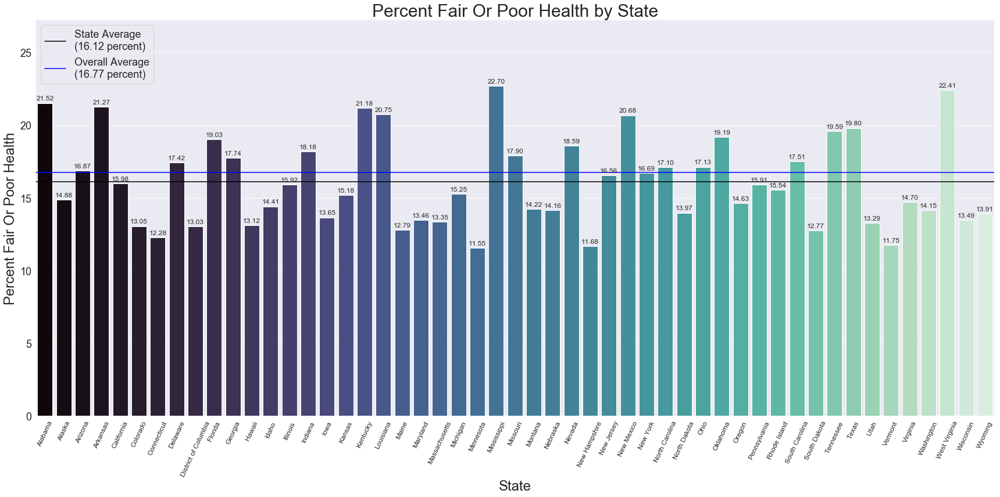

In [30]:
barplot_states_percent(state_perc_df,percent_cols[0],'state',total_col = 'total_population')

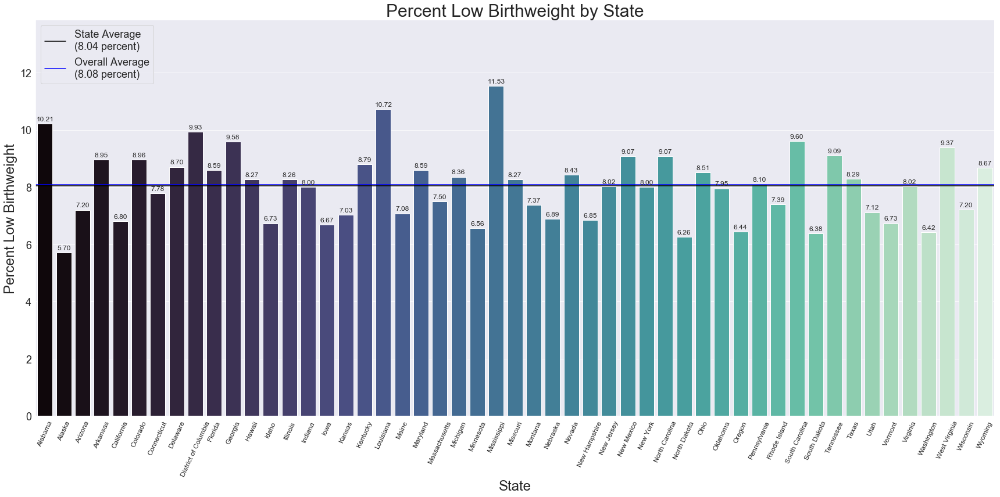

In [31]:
barplot_states_percent(state_perc_df,percent_cols[1],'state',total_col = 'total_population')

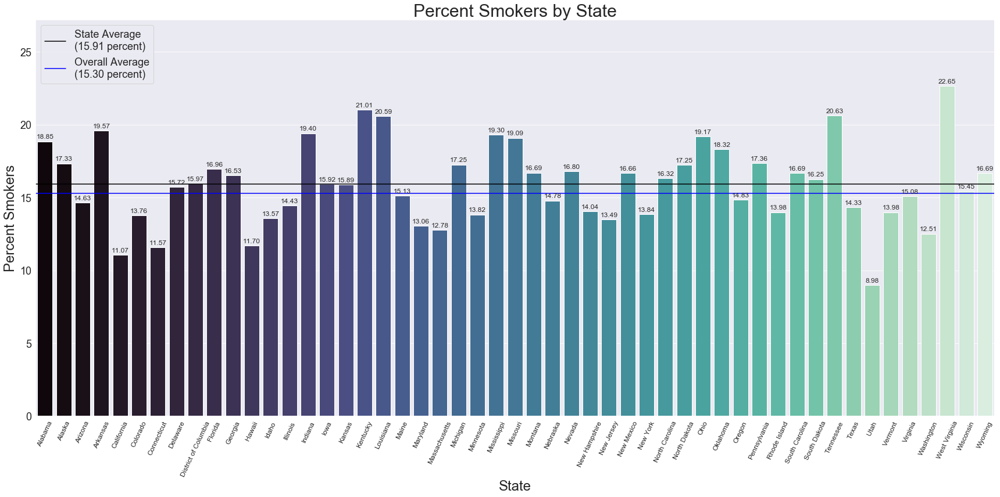

In [32]:
barplot_states_percent(state_perc_df,percent_cols[2],'state',total_col = 'total_population')

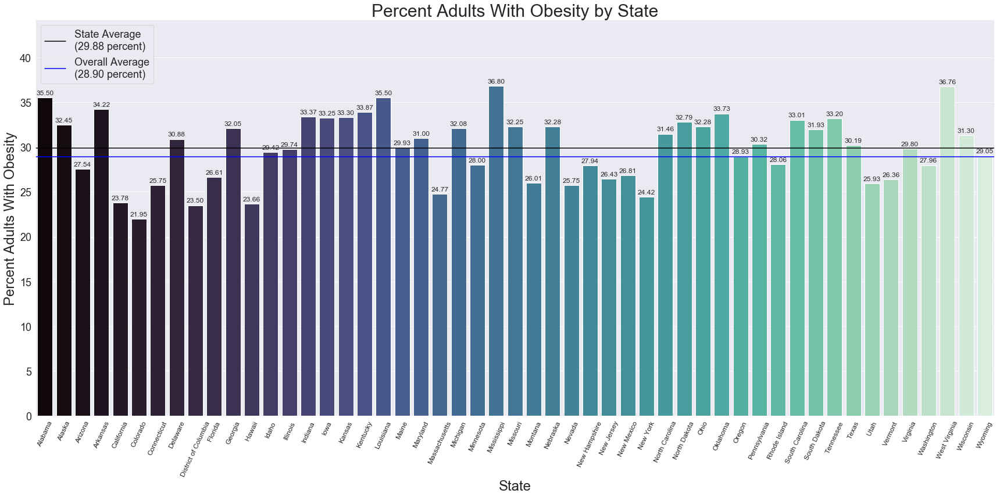

In [33]:
barplot_states_percent(state_perc_df,percent_cols[3],'state',total_col = 'total_population')

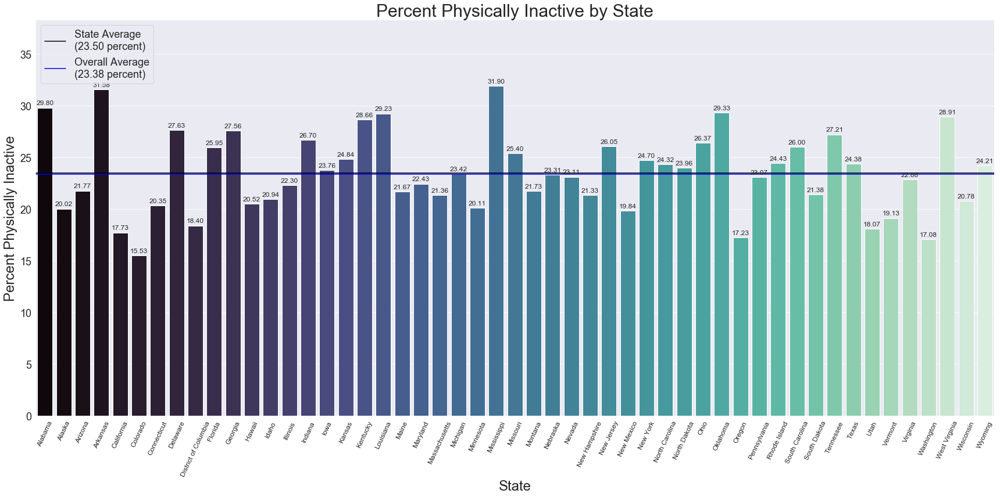

In [34]:
barplot_states_percent(state_perc_df,percent_cols[4],'state',total_col = 'total_population')

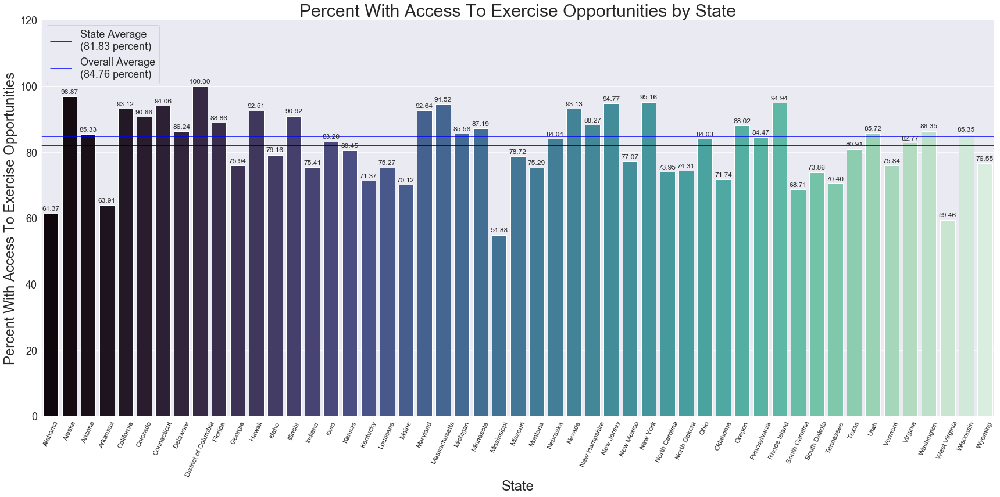

In [35]:
barplot_states_percent(state_perc_df,percent_cols[5],'state',total_col = 'total_population')

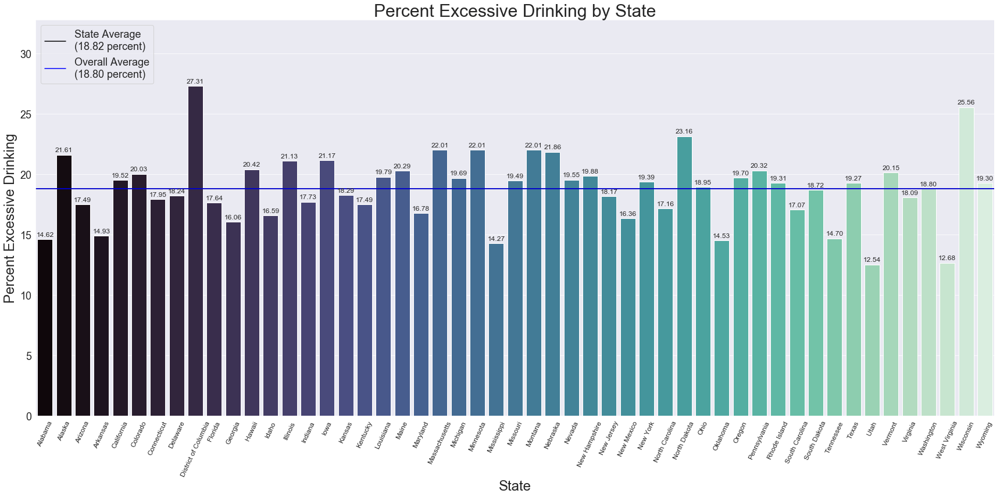

In [36]:
barplot_states_percent(state_perc_df,percent_cols[6],'state',total_col = 'total_population')

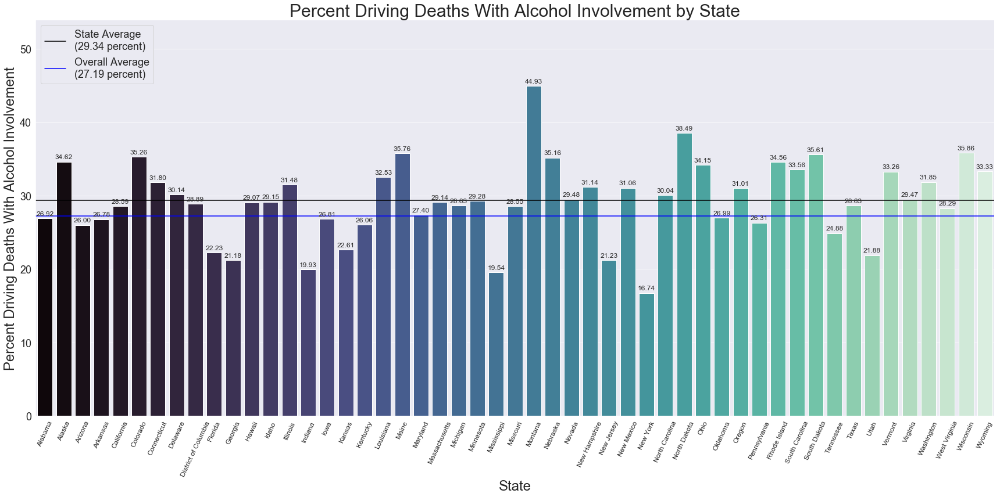

In [37]:
barplot_states_percent(state_perc_df,percent_cols[7],'state',total_col = 'total_population')

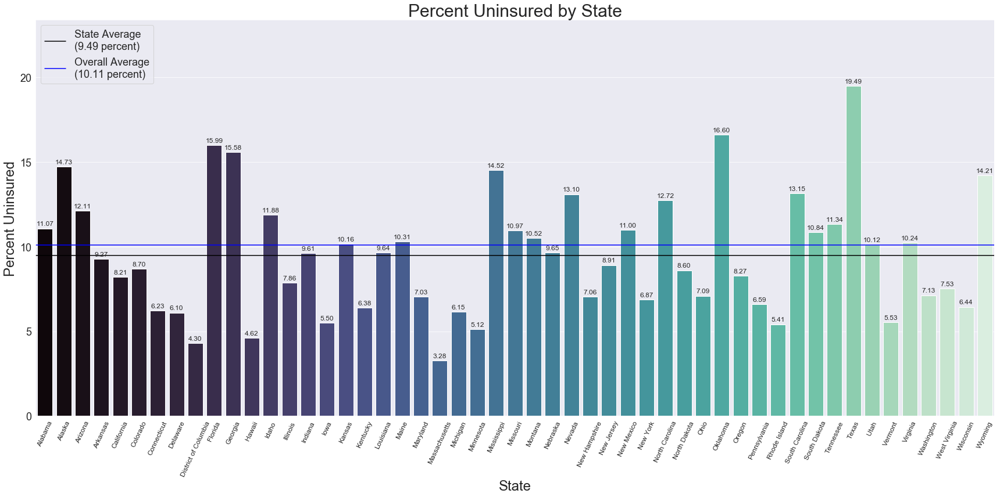

In [38]:
barplot_states_percent(state_perc_df,percent_cols[8],'state',total_col = 'total_population')

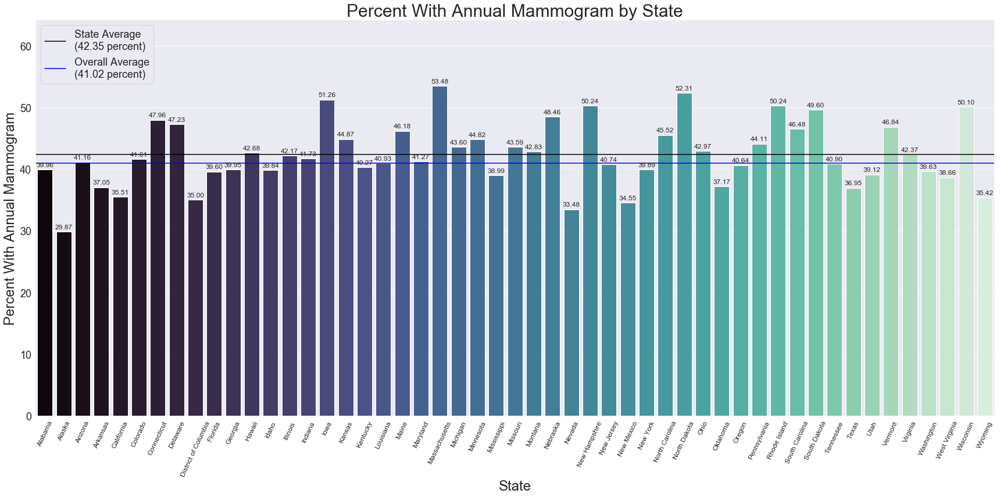

In [39]:
barplot_states_percent(state_perc_df,percent_cols[9],'state',total_col = 'total_population')

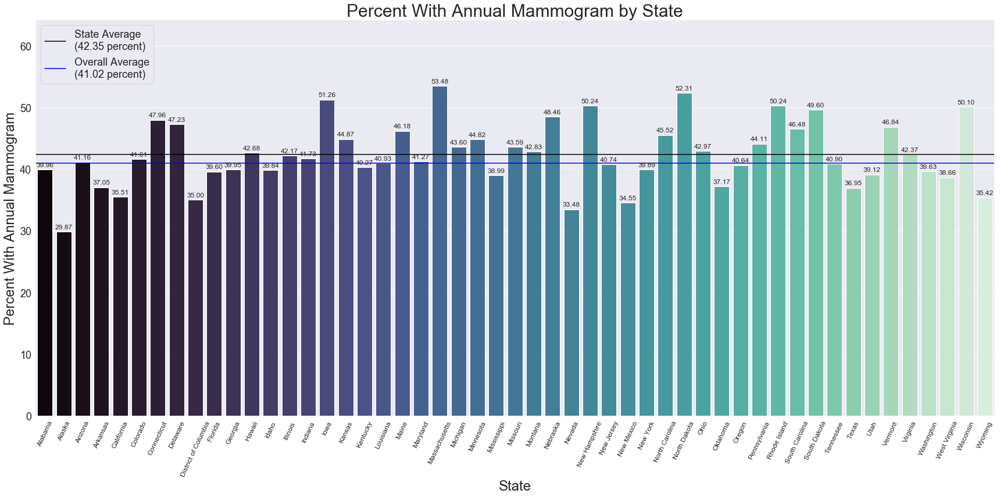

In [40]:
barplot_states_percent(state_perc_df,percent_cols[9],'state',total_col = 'total_population')

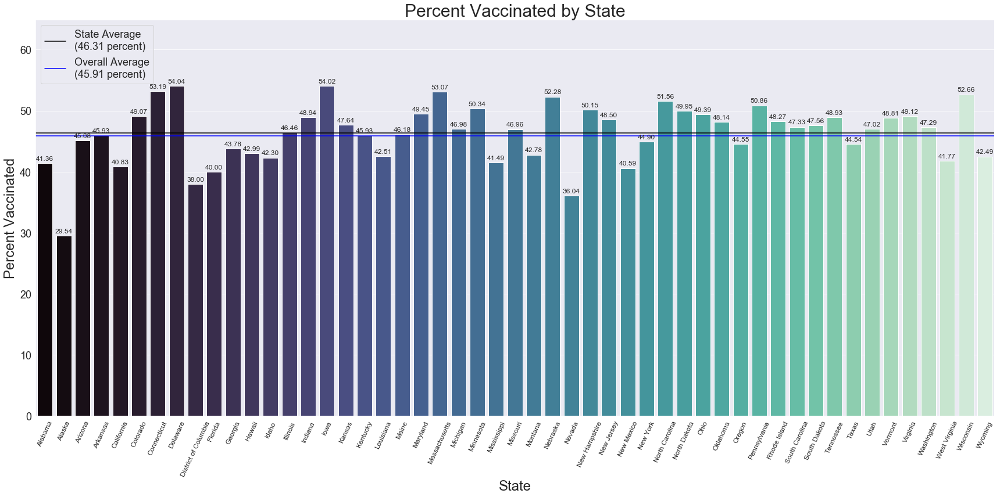

In [41]:
barplot_states_percent(state_perc_df,percent_cols[10],'state',total_col = 'total_population')

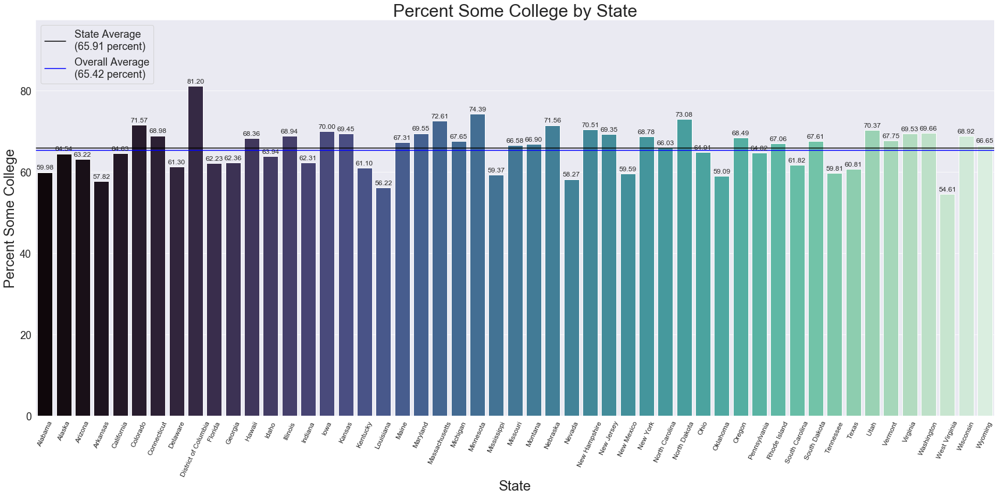

In [42]:
barplot_states_percent(state_perc_df,percent_cols[11],'state',total_col = 'total_population')

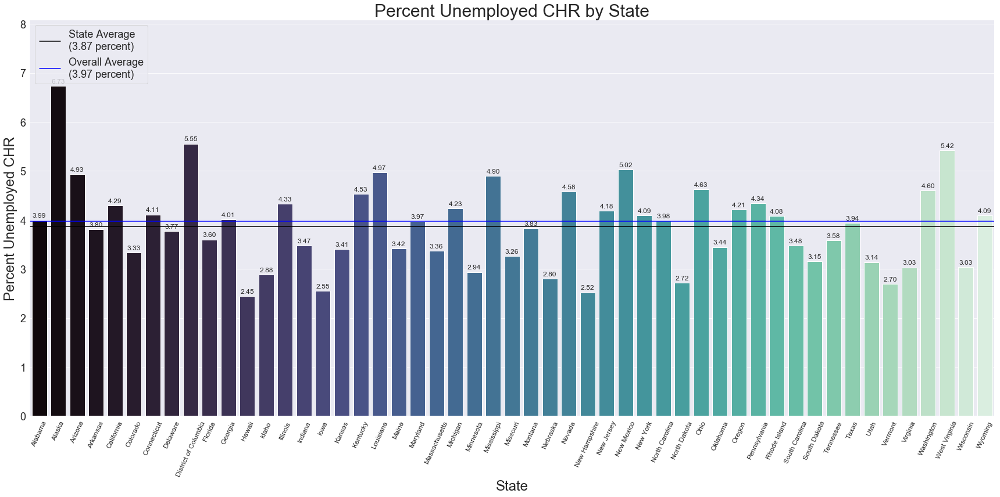

In [43]:
barplot_states_percent(state_perc_df,percent_cols[12],'state',total_col = 'total_population')

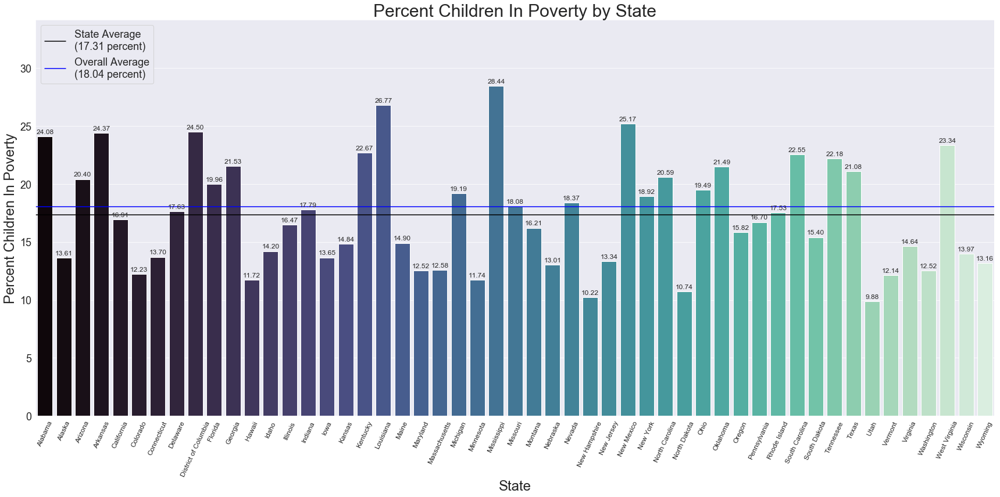

In [44]:
barplot_states_percent(state_perc_df,percent_cols[13],'state',total_col = 'total_population')

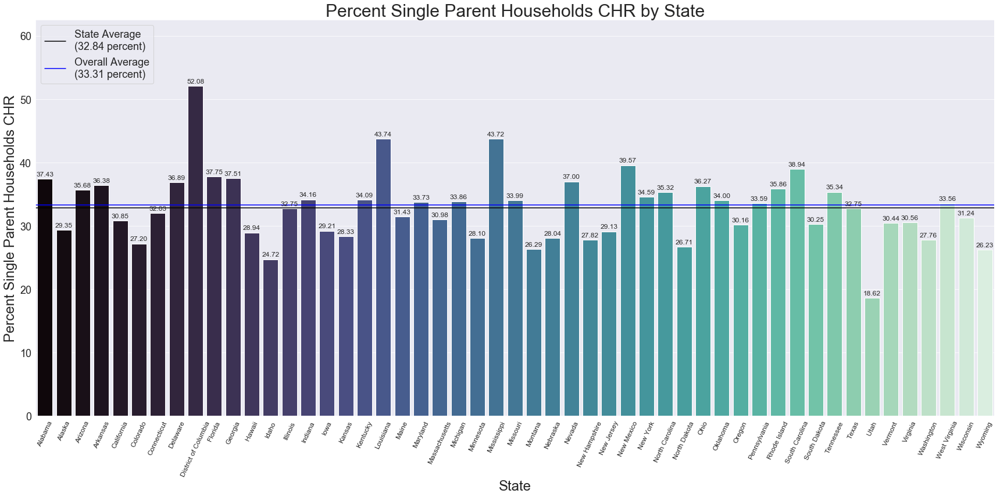

In [45]:
barplot_states_percent(state_perc_df,percent_cols[14],'state',total_col = 'total_population')

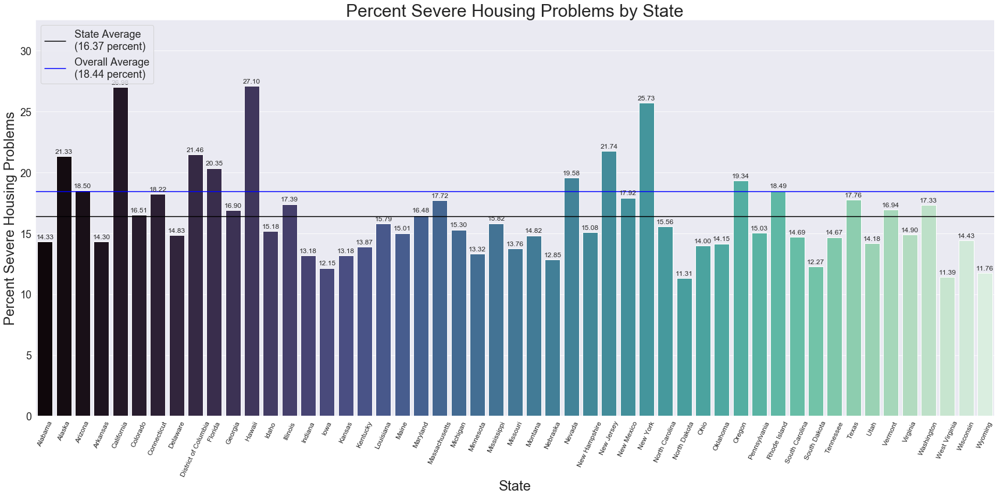

In [46]:
barplot_states_percent(state_perc_df,percent_cols[15],'state',total_col = 'total_population')

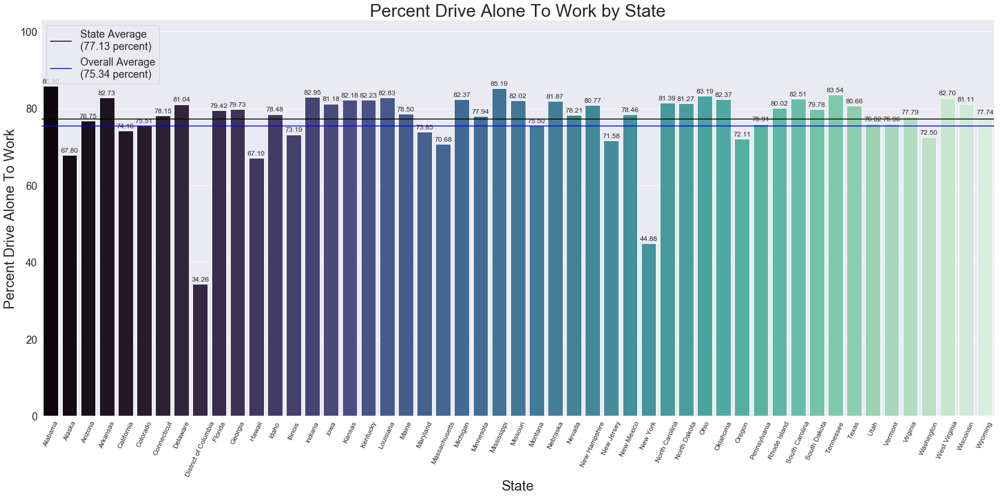

In [47]:
barplot_states_percent(state_perc_df,percent_cols[16],'state',total_col = 'total_population')

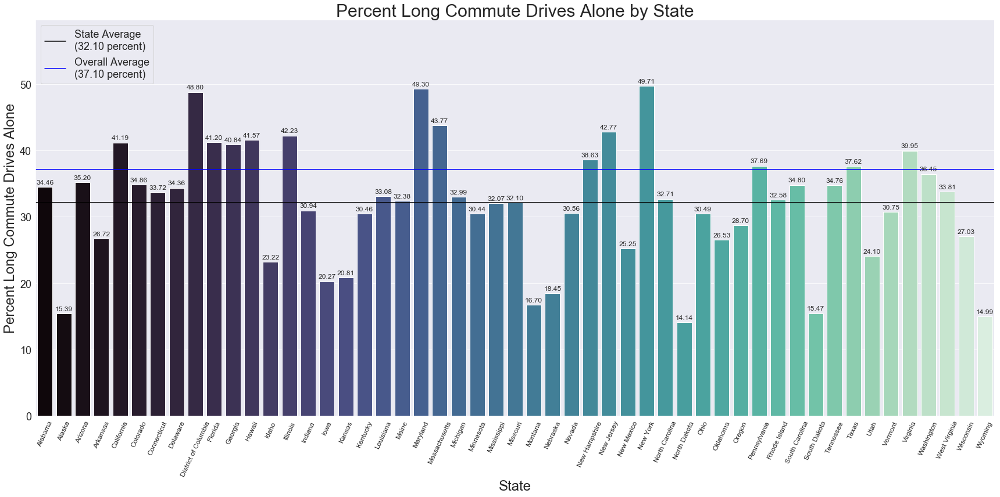

In [48]:
barplot_states_percent(state_perc_df,percent_cols[17],'state',total_col = 'total_population')

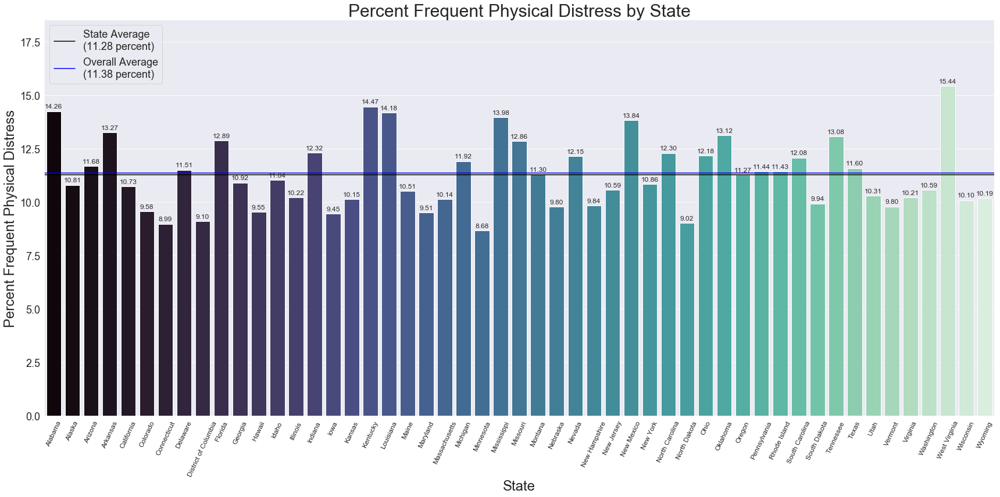

In [49]:
barplot_states_percent(state_perc_df,percent_cols[18],'state',total_col = 'total_population')

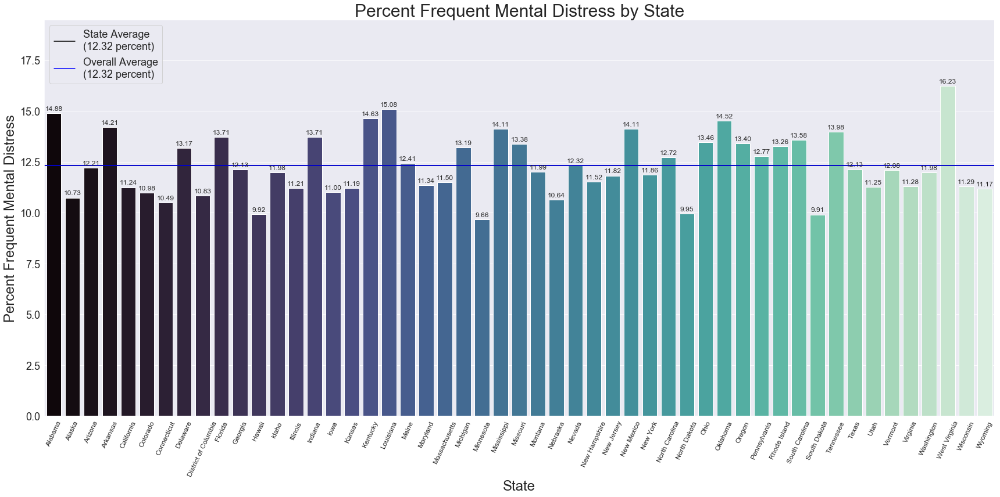

In [50]:
barplot_states_percent(state_perc_df,percent_cols[19],'state',total_col = 'total_population')

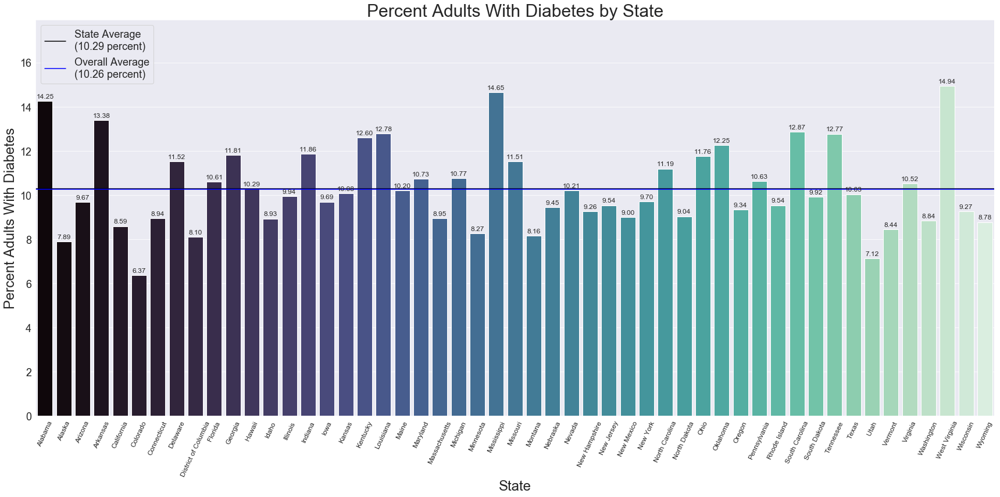

In [51]:
barplot_states_percent(state_perc_df,percent_cols[20],'state',total_col = 'total_population')

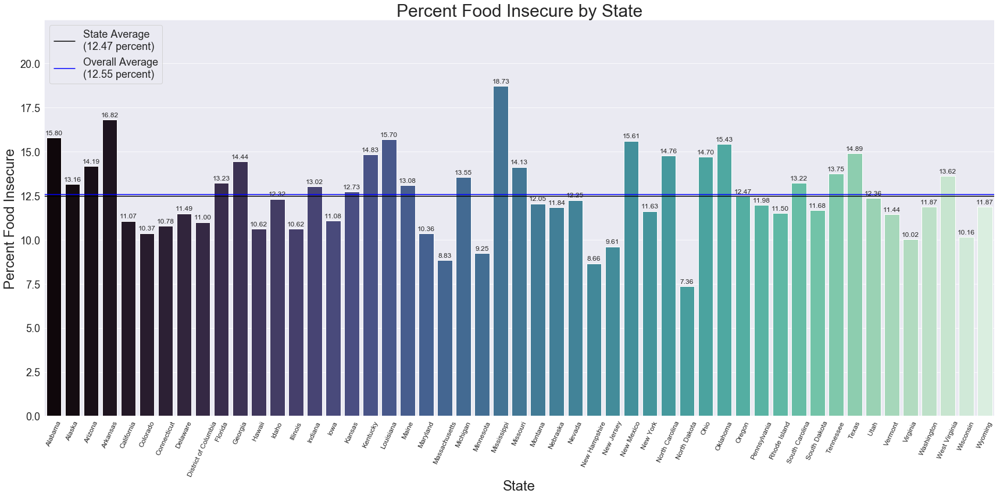

In [52]:
barplot_states_percent(state_perc_df,percent_cols[21],'state',total_col = 'total_population')

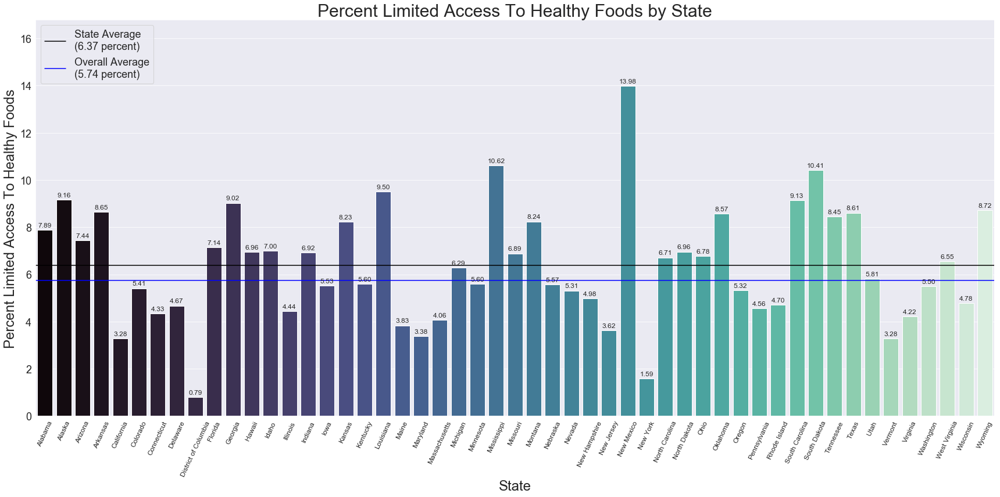

In [53]:
barplot_states_percent(state_perc_df,percent_cols[22],'state',total_col = 'total_population')

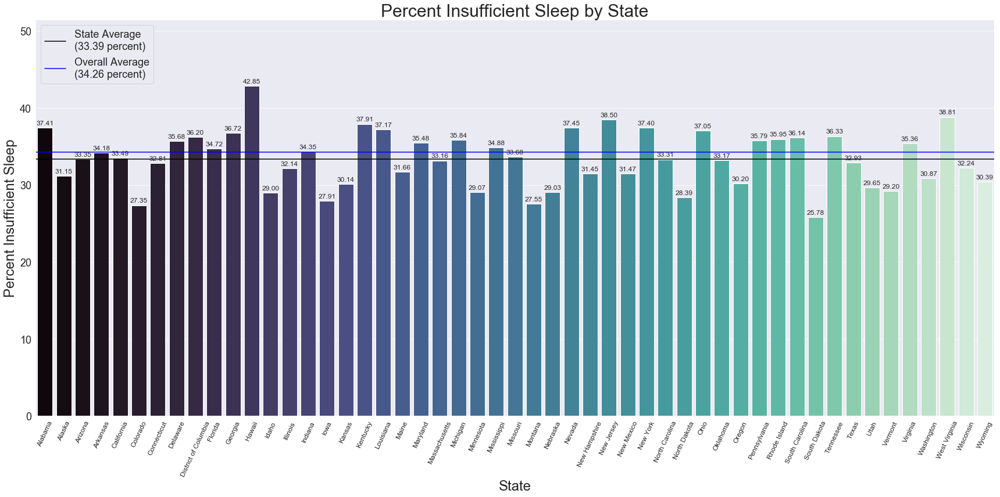

In [54]:
barplot_states_percent(state_perc_df,percent_cols[23],'state',total_col = 'total_population')

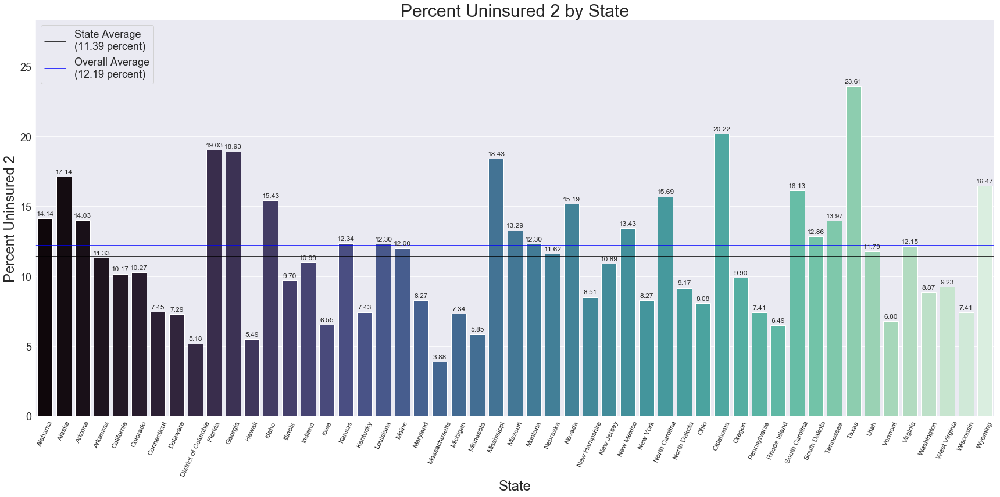

In [55]:
barplot_states_percent(state_perc_df,percent_cols[24],'state',total_col = 'total_population')

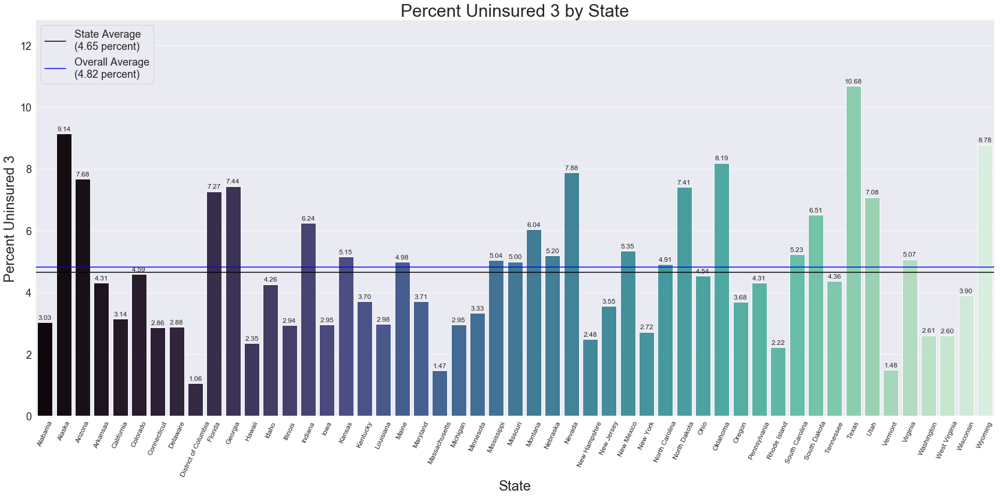

In [56]:
barplot_states_percent(state_perc_df,percent_cols[25],'state',total_col = 'total_population')

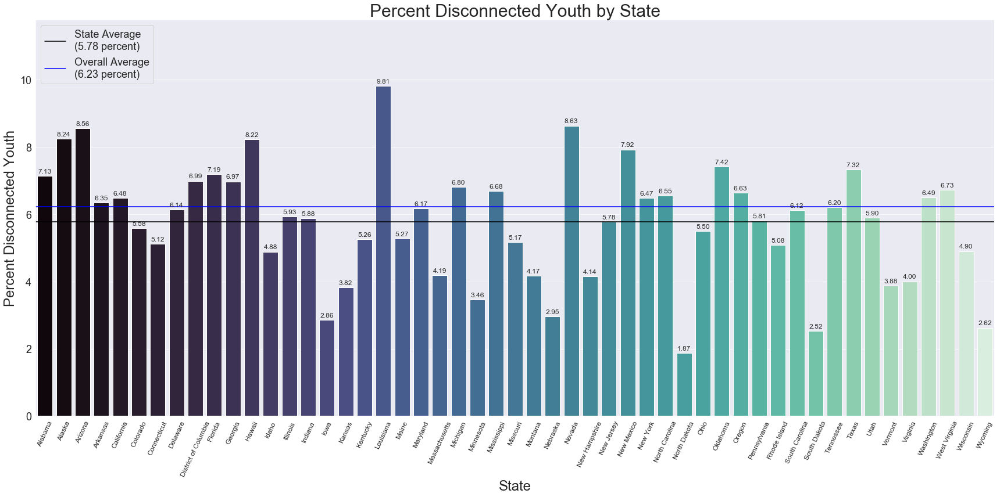

In [57]:
barplot_states_percent(state_perc_df,percent_cols[26],'state',total_col = 'total_population')

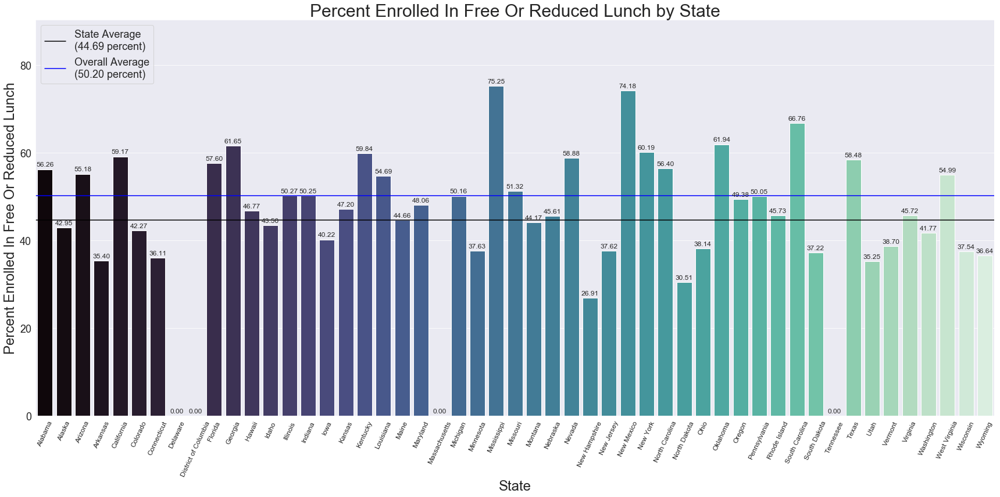

In [58]:
barplot_states_percent(state_perc_df,percent_cols[27],'state',total_col = 'total_population')

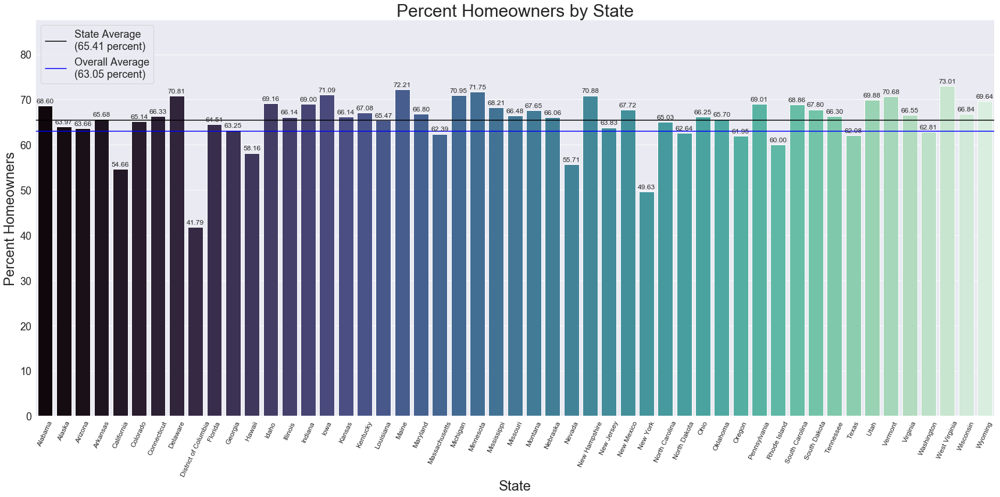

In [59]:
barplot_states_percent(state_perc_df,percent_cols[28],'state',total_col = 'total_population')

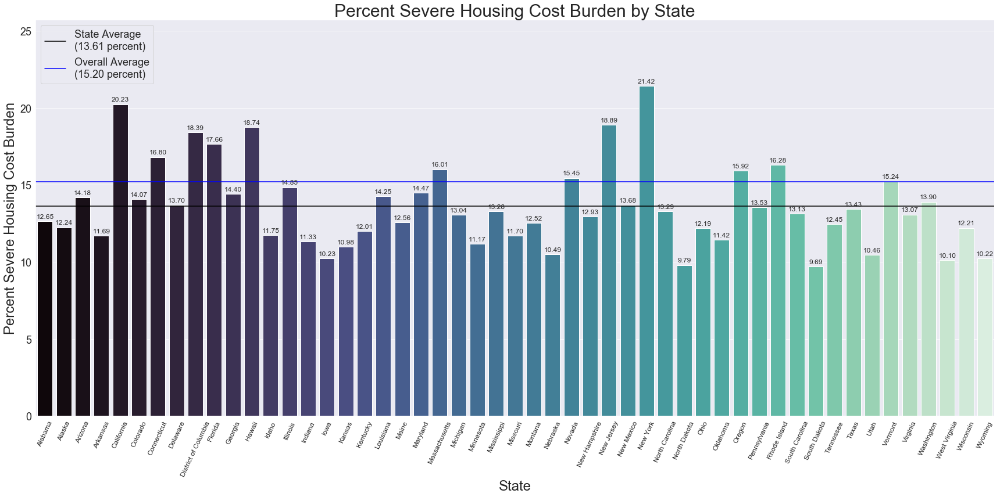

In [60]:
barplot_states_percent(state_perc_df,percent_cols[29],'state',total_col = 'total_population')

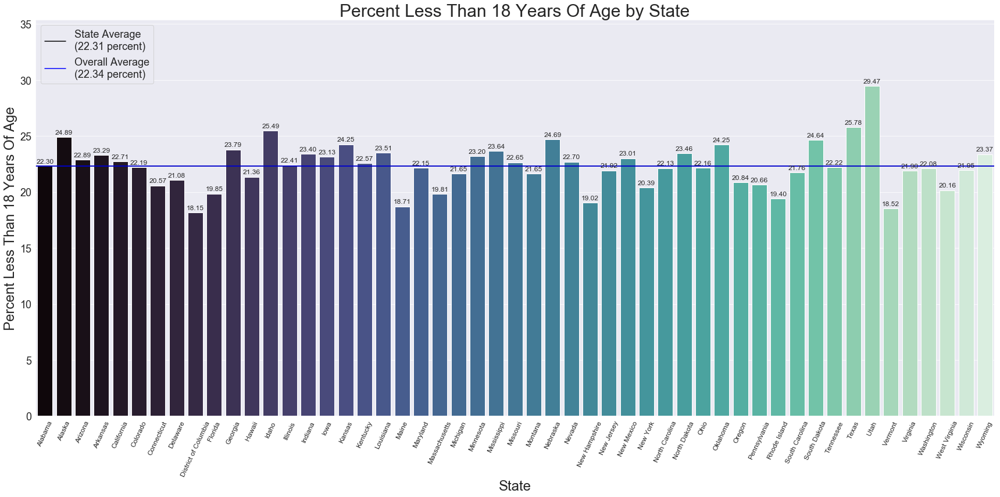

In [61]:
barplot_states_percent(state_perc_df,percent_cols[30],'state',total_col = 'total_population')

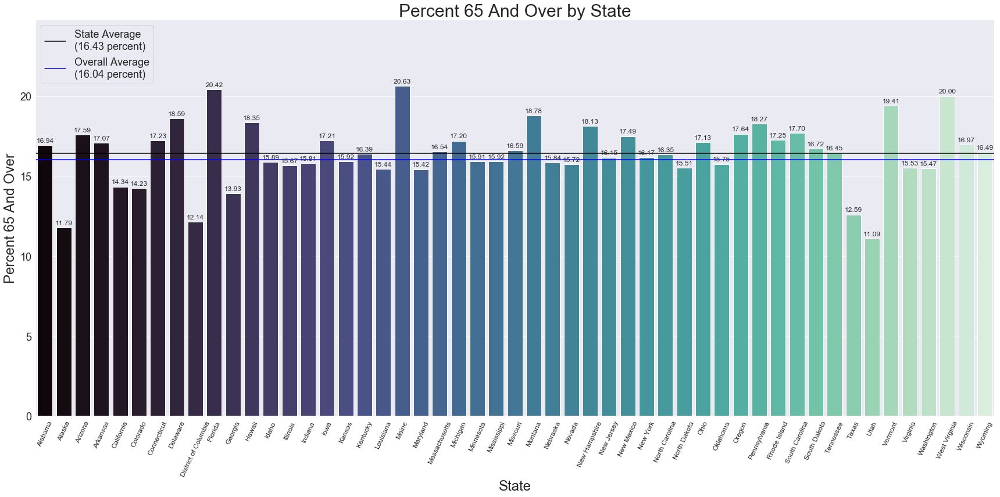

In [62]:
barplot_states_percent(state_perc_df,percent_cols[31],'state',total_col = 'total_population')

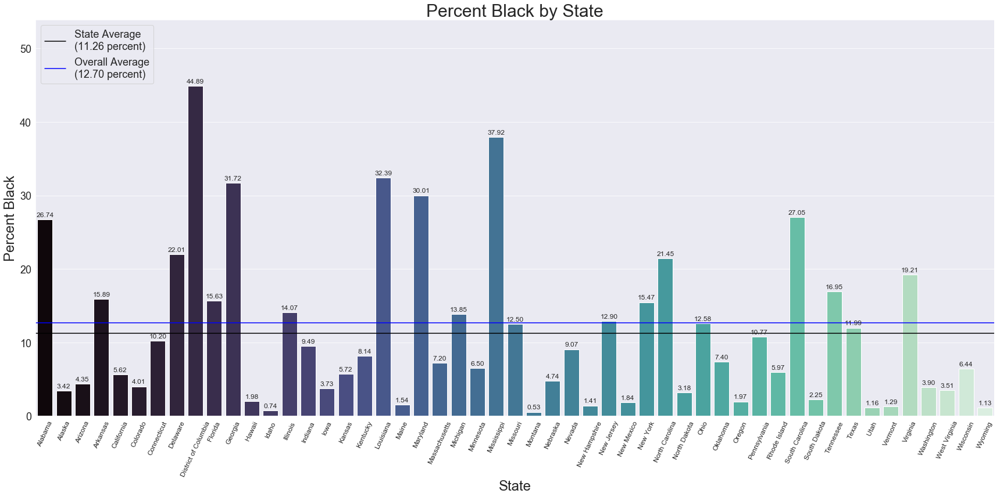

In [63]:
barplot_states_percent(state_perc_df,percent_cols[32],'state',total_col = 'total_population')

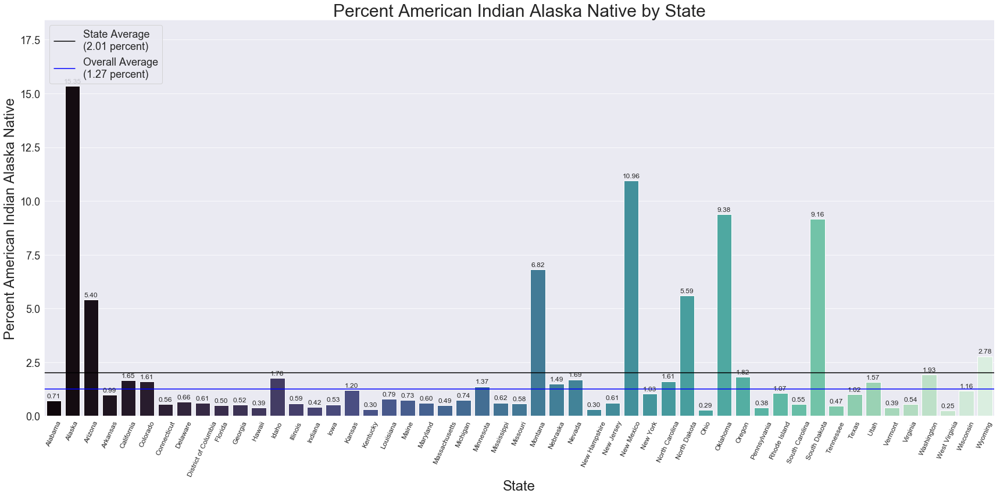

In [64]:
barplot_states_percent(state_perc_df,percent_cols[33],'state',total_col = 'total_population')

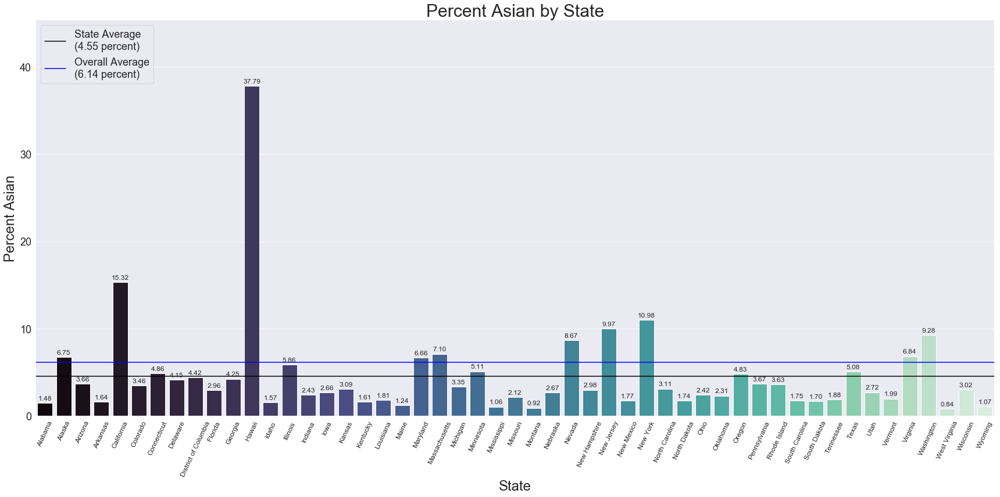

In [65]:
barplot_states_percent(state_perc_df,percent_cols[34],'state',total_col = 'total_population')

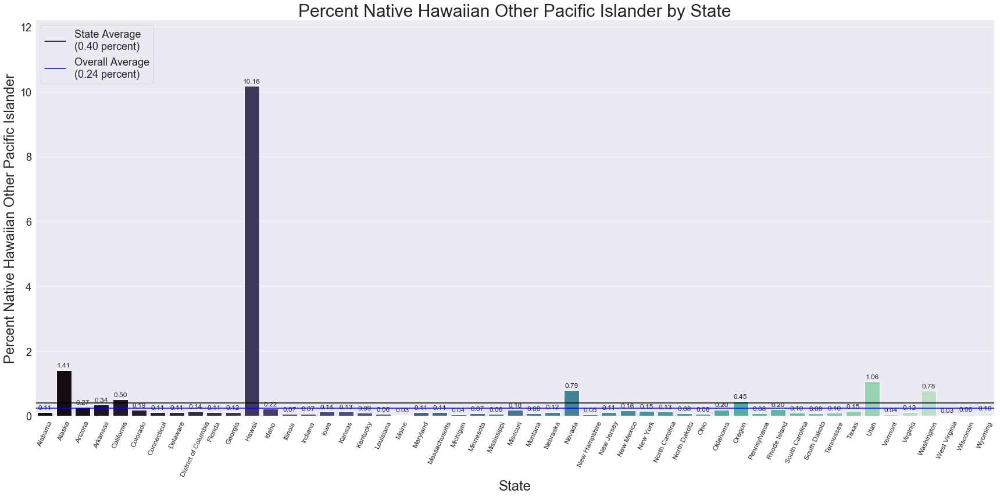

In [66]:
barplot_states_percent(state_perc_df,percent_cols[35],'state',total_col = 'total_population')

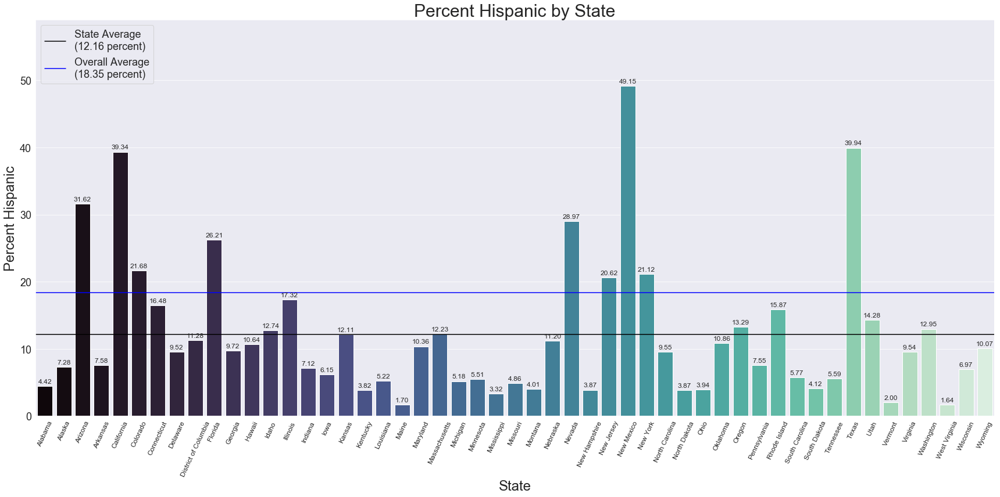

In [67]:
barplot_states_percent(state_perc_df,percent_cols[36],'state',total_col = 'total_population')

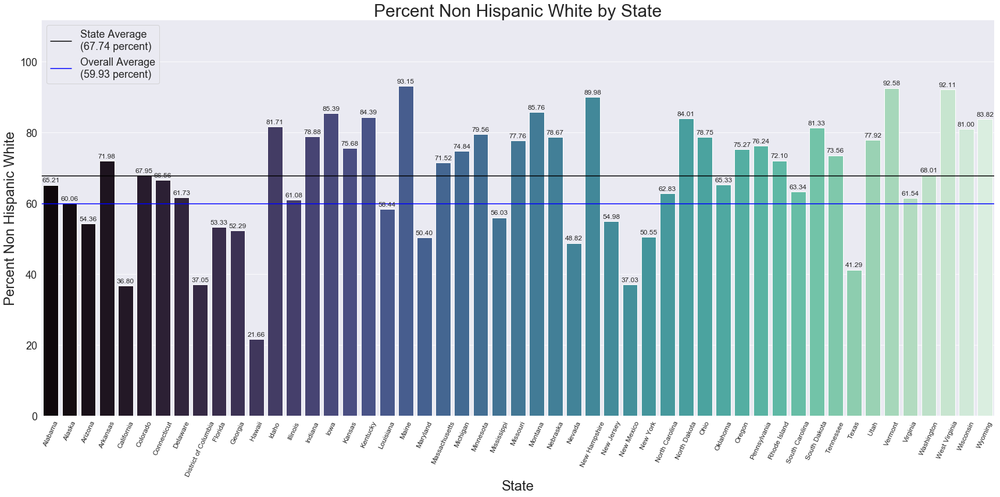

In [68]:
barplot_states_percent(state_perc_df,percent_cols[37],'state',total_col = 'total_population')

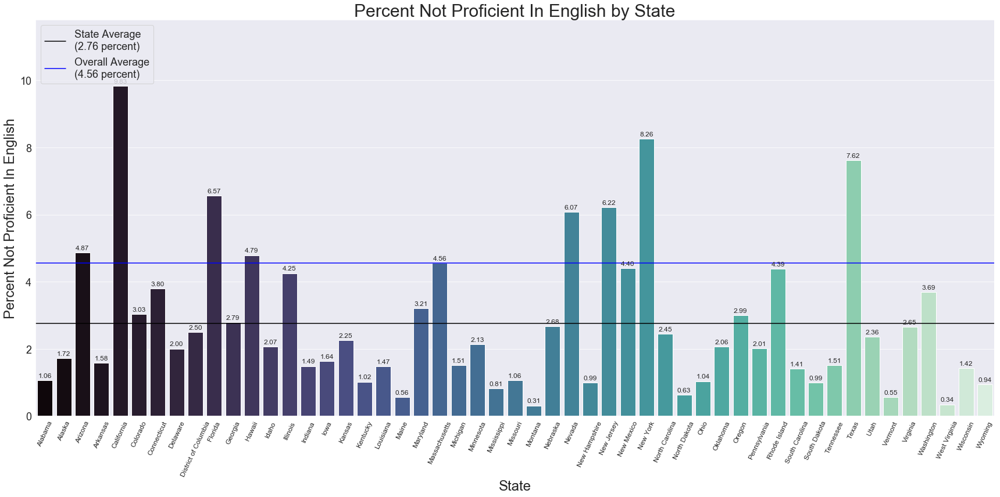

In [69]:
barplot_states_percent(state_perc_df,percent_cols[38],'state',total_col = 'total_population')

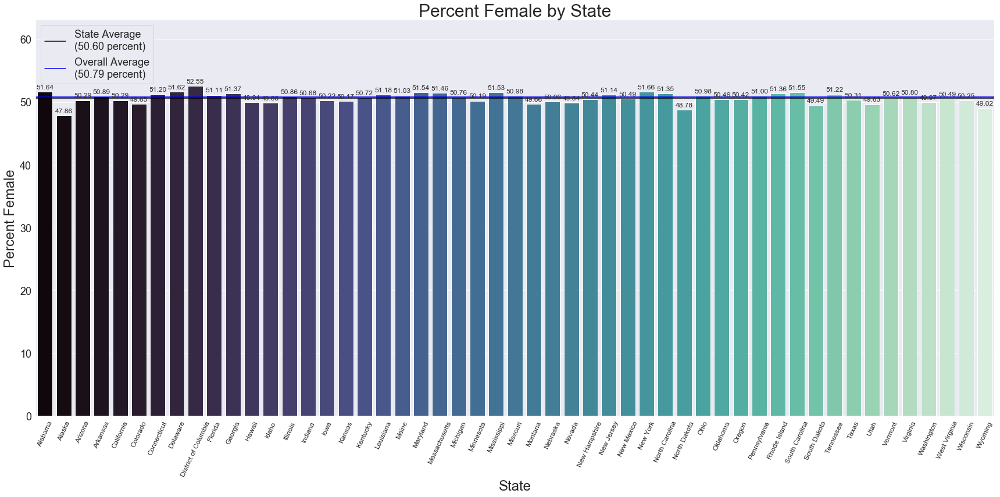

In [70]:
barplot_states_percent(state_perc_df,percent_cols[39],'state',total_col = 'total_population')

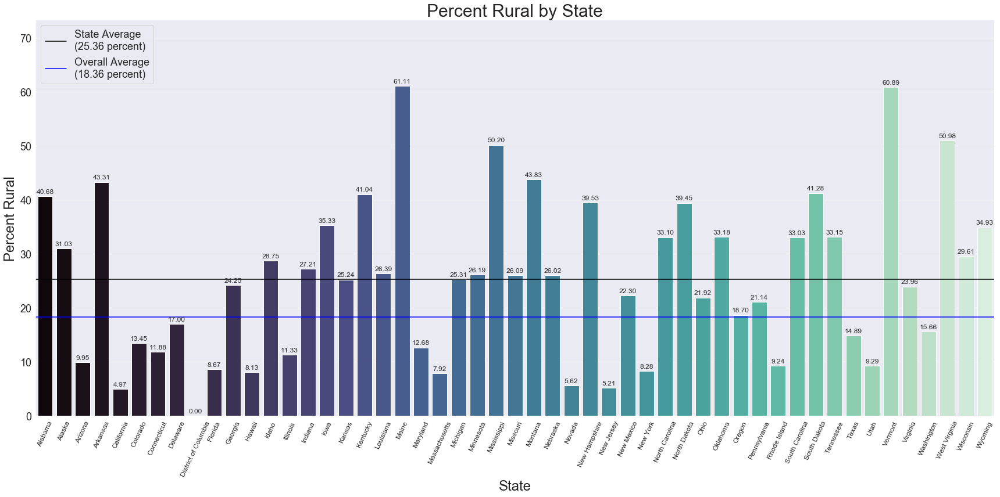

In [71]:
barplot_states_percent(state_perc_df,percent_cols[40],'state',total_col = 'total_population')

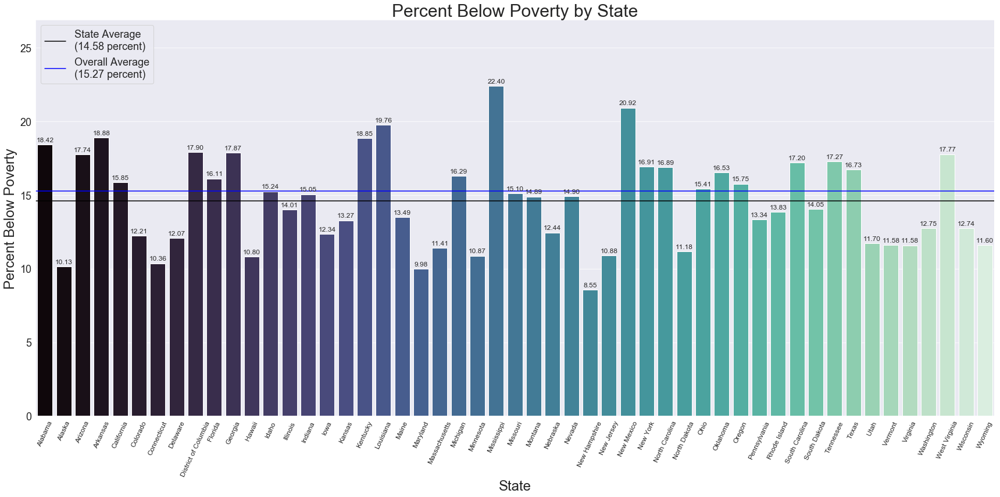

In [72]:
barplot_states_percent(state_perc_df,percent_cols[41],'state',total_col = 'total_population')

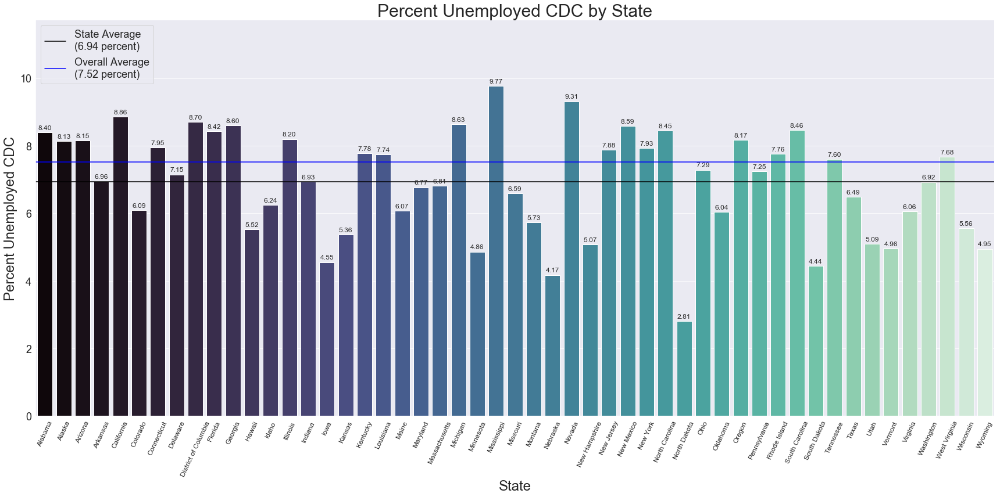

In [73]:
barplot_states_percent(state_perc_df,percent_cols[42],'state',total_col = 'total_population')

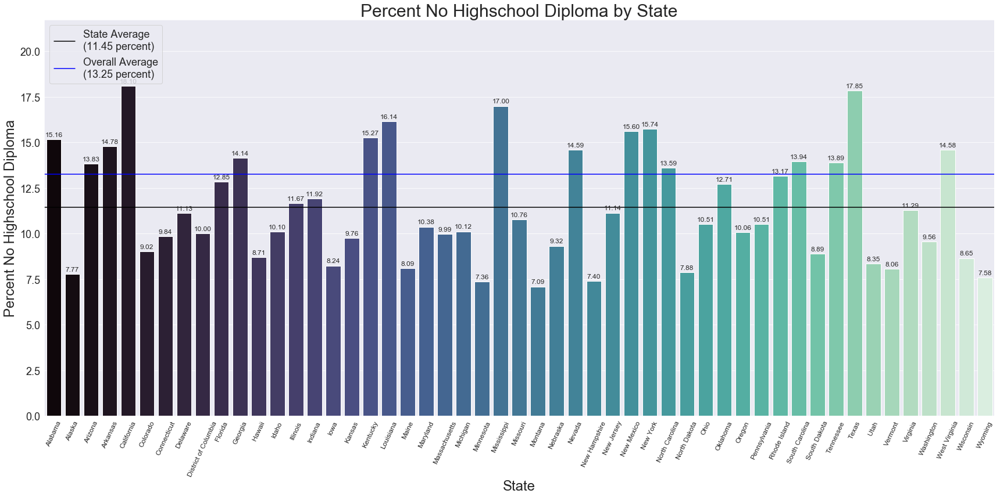

In [74]:
barplot_states_percent(state_perc_df,percent_cols[43],'state',total_col = 'total_population')

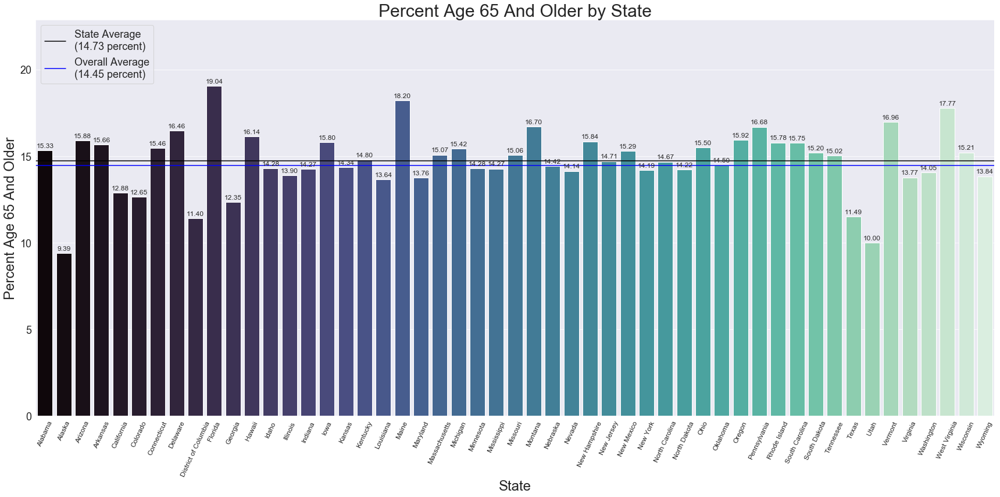

In [75]:
barplot_states_percent(state_perc_df,percent_cols[44],'state',total_col = 'total_population')